In [261]:
# Import Relevant Libraries

# Import modules for Astronomy Data Extraction:
from astroquery.sdss import SDSS
from astroquery.gaia import Gaia
from astropy import coordinates as coords

# Import modules for data manipulation and data visualization
import numpy as np
import pandas as pd
import networkx as nx

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.cm as cm
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import gaussian_kde
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
sns.set_context("notebook")

# Import modules for machine learning
import sklearn as sk
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.feature_selection import mutual_info_regression
from sklearn.mixture import GaussianMixture
from lazypredict.Supervised import LazyRegressor

# Import modules for deep learning
import torch as torch
import pytorch_lightning as L
from torch.optim.lr_scheduler import ReduceLROnPlateau
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor, ModelCheckpoint
from pytorch_lightning.callbacks.lr_monitor import LearningRateMonitor
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data_utils
import pytorch_lightning.callbacks as callbacks
import torch_geometric as tg
from torch_geometric.utils import to_networkx
from torchsummary import summary
from torch_geometric.nn import SAGEConv, GraphNorm, GATConv, GINConv
from torch_geometric.data import InMemoryDataset, Data, DataLoader
from torch.utils.data import TensorDataset, dataloader

# Abstract Equivalent:
In this experiment, we extract the stellar properties of 250000 stars from the GAIA database with the goal of regressing the evolutionary stage, age and luminosity of a star from it's geometric,photometric and spectroscopic information using a graph neural network. We start by performing exporloratory data analysis to identify correlations between features and targets, to perform feature selection and data preprocessing. Once completed, we create two baselines to compare the graph neural network against. The first baseline is created by training a LazyRegressor, which trains and evaluates a host of machine learning models on the stellar dataset. The second baseline is created by training, optimising and evaluating a feedforward neural network for the regression task. The stellar dataset is then converted into a graphical stellar dataset and fed into a GraphSage Network. This network is trained, evaluated and then compared with the baseline models, using metrics and visualisations. 

# About the Source of the Data:
GAIA, originally meaning Global Astrometric Inferometer for Astrophysics, is a space observatory of the European Space Agency (ESA) with the aim of producing the largest and most precise 3D space catalogure of our Milky Way Galaxy and Local Group. This 3D space catalogue will contain approximately 1 billion astromical objects. GAIA consists of 2 telescopes pointing at diametrically opposed parts of the sky with a wide angle of 106.5 degrees between them. GAIA then rotates, its axis perpendicular to the viewing plane of the telescopes. This allows GAIA to simultanously make measurements of opposite parts of sky. GAIA, uses it astrometry instrument (ASTRO) to precisely determine the angular positions of the stars. The angular positions of the stars are measured 70 times over the 5 year long mission. The measurements are then used to determine the parallax and proper motion which in turn gives the distances. 

In [3]:
# The following performs a query to the Gaia database to extract the data of interest.
# The query is written in SQL and is executed using the Gaia module from astroquery.
# The data is then stored in a pandas dataframe for further analysis.
gaia_query = """

    SELECT TOP 250000
    gdr3.source_id, gdr3.ra, gdr3.dec, gdr3.parallax, gdr3.pmra, gdr3.pmdec, gdr3.phot_g_mean_mag, gdr3.phot_bp_mean_mag, gdr3.phot_rp_mean_mag, 
    gdr3.teff_gspphot, gdr3.logg_gspphot, gdr3.distance_gspphot, gdr3.ag_gspphot, gdr3.azero_gspphot, gdr3.mh_gspphot, gdr3.bp_rp, gdr3.bp_g, gdr3.g_rp,
    gdr3.phot_g_mean_flux, gdr3.phot_bp_mean_flux, gdr3.phot_rp_mean_flux, astro.radius_flame, astro.mass_flame, astro.age_flame, 
    astro.evolstage_flame, astro.lum_flame

    FROM gaiadr3.gaia_source as gdr3
    JOIN gaiadr3.astrophysical_parameters as astro
    ON gdr3.source_id = astro.source_id

    WHERE parallax >0
    AND gdr3.teff_gspphot IS NOT NULL
    AND gdr3.distance_gspphot IS NOT NULL
    AND gdr3.phot_g_mean_mag IS NOT NULL
    AND gdr3.phot_bp_mean_mag IS NOT NULL
    AND radius_flame IS NOT NULL
    AND age_flame IS NOT NULL
    AND lum_flame IS NOT NULL
    AND mass_flame IS NOT NULL
    """

gaia_job = Gaia.launch_job_async(gaia_query)
gaia_data = gaia_job.get_results().to_pandas()

gaia_data.head()

INFO: Query finished. [astroquery.utils.tap.core]


,SOURCE_ID,ra,dec,parallax,pmra,pmdec,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,teff_gspphot,...,bp_g,g_rp,phot_g_mean_flux,phot_bp_mean_flux,phot_rp_mean_flux,radius_flame,mass_flame,age_flame,evolstage_flame,lum_flame
0,6030020838301513600,256.46,-28.45,0.07,-4.77,-6.74,16.54,17.26,15.71,5308.67,...,0.71,0.83,4553.81,1709.52,4118.02,2.19,1.16,6.52,483,3.36
1,6030020838301513856,256.47,-28.45,0.39,-3.18,-0.71,15.95,16.42,15.28,5664.61,...,0.47,0.67,7863.63,3698.75,6149.74,1.75,1.05,9.24,452,2.76
2,6030020838301517952,256.46,-28.45,0.13,-2.74,-3.10,15.71,16.39,14.81,4842.31,...,0.68,0.90,9808.65,3791.18,9458.20,3.38,1.06,9.49,664,5.63
3,6030020868250061312,256.48,-28.44,0.91,-3.65,-4.55,14.91,15.33,14.29,5935.00,...,0.42,0.62,20458.44,10111.94,15264.43,1.19,0.96,10.67,368,1.37
4,6030020868250070144,256.47,-28.43,0.08,-5.81,-4.94,15.55,16.35,14.67,4825.31,...,0.80,0.87,11388.77,3945.54,10722.38,3.80,1.07,9.24,711,6.96


# Provided here is a short description of the features and targets:
# Features:
source_id: Unique identifier for each star \
ra: Right Ascension of the star \
dec: Declination of the star \
parallax: Parallax of the star \
pmra: Proper motion in Right Ascension \
pmdec: Proper motion in Declination \
phot_g_mean_mag: Mean G-band magnitude \
phot_bp_mean_mag: Mean BP-band magnitude \
phot_rp_mean_mag: Mean RP-band magnitude \
teff_gspphot: Effective temperature of the star \
logg_gspphot: Surface gravity of the star \
distance_gspphot: Distance to the star \
ag_gspphot: Extinction in the G-band \
azero_gspphot: Zero-point offset in the G-band \
mh_gspphot: Metallicity of the star \
bp_rp: BP-RP color \
bp_g: BP-G color \
g_rp: G-RP color \
phot_g_mean_flux: Mean G-band flux \
phot_bp_mean_flux: Mean BP-band flux \
phot_rp_mean_flux: Mean RP-band flux \
radius_flame: Radius of the star \
mass_flame: Mass of the star 

# Targets:
age_flame: Age of the star \
evolstage_flame: Evolutionary stage of the star \
lum_flame: Luminosity of the star

# Exploratory Data Analysis:
Stage 1 is to obtain the stellar features needed to regress the age, evolutionary stage and lumonsity of the star.
200000 stars were extracted from the gaia archieve with dataset containing information on the star's geometric, photometric and spectroscopic properties. 
Once extracted from the GAIA archieve, the first step is extract the features and targets, perform some data preprocessing and then identify the relationships between them. 
This was achieved through a combination of metrics, visualisations and evaluations of the dataset. 
This first half of the experiment treats the stars as individual data points and does not account for the information stored between stars in a cluster.

In [4]:
# The GAIA data is then intially explored through a series of plots to understand the distribution of the data.
gaia_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 26 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   SOURCE_ID          250000 non-null  int64  
 1   ra                 250000 non-null  float64
 2   dec                250000 non-null  float64
 3   parallax           250000 non-null  float64
 4   pmra               250000 non-null  float64
 5   pmdec              250000 non-null  float64
 6   phot_g_mean_mag    250000 non-null  float32
 7   phot_bp_mean_mag   250000 non-null  float32
 8   phot_rp_mean_mag   250000 non-null  float32
 9   teff_gspphot       250000 non-null  float32
 10  logg_gspphot       250000 non-null  float32
 11  distance_gspphot   250000 non-null  float32
 12  ag_gspphot         250000 non-null  float32
 13  azero_gspphot      250000 non-null  float32
 14  mh_gspphot         250000 non-null  float32
 15  bp_rp              250000 non-null  float32
 16  bp

In [5]:
# This function is used to capture the main statistics of the features and targets of the stars
gaia_data.describe()

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,teff_gspphot,...,bp_g,g_rp,phot_g_mean_flux,phot_bp_mean_flux,phot_rp_mean_flux,radius_flame,mass_flame,age_flame,evolstage_flame,lum_flame
count,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,...,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00,250000.00
mean,4853441937771664384.00,254.22,-17.05,0.57,-2.49,-3.57,16.28,16.99,15.49,5173.42,...,0.70,0.79,26044.96,12876.88,19261.94,2.88,1.17,5.85,380.97,15.35
std,1107588904114435328.00,35.69,41.41,0.57,4.78,6.69,1.33,1.47,1.27,857.83,...,0.36,0.22,498963.65,311585.83,296142.50,5.07,0.62,4.15,180.28,67.98
min,2263180686745679872.00,156.14,-64.94,0.00,-155.03,-319.05,5.36,5.37,5.30,3144.02,...,-0.29,0.01,943.98,38.34,561.09,0.38,0.50,0.20,100.00,0.03
25%,4471172615700894720.00,255.41,-56.44,0.22,-4.76,-6.62,15.56,16.13,14.80,4681.45,...,0.45,0.62,2304.59,792.21,2068.60,0.81,0.77,2.10,250.00,0.30
50%,4500714461619438080.00,265.59,-23.06,0.48,-2.34,-3.75,16.48,17.18,15.66,5009.10,...,0.59,0.74,4828.73,1828.56,4314.29,1.20,0.96,5.09,351.00,1.34
75%,5917171978018680832.00,270.75,13.65,0.71,-0.05,-0.25,17.28,18.09,16.46,5529.94,...,0.85,0.93,11267.35,4831.03,9536.07,2.76,1.27,9.59,488.00,5.99
max,6030135153124513792.00,318.71,76.78,41.47,109.76,478.56,18.25,21.38,17.88,11942.23,...,5.12,2.01,135623956.68,97035336.01,59993872.90,168.75,3.81,13.50,1289.00,3426.33


<Axes: xlabel='ra', ylabel='dec'>

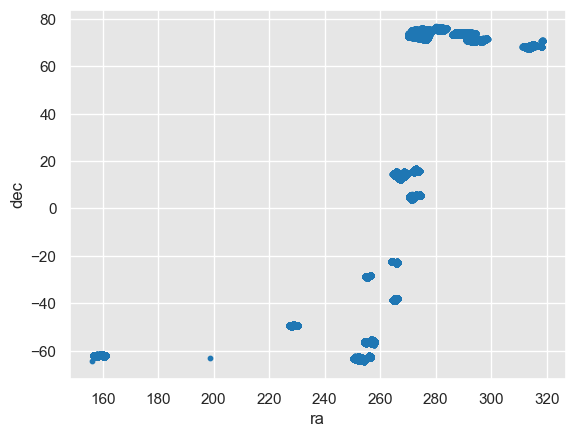

In [6]:
# A plot showing the positions of the stars in right ascension and declination
gaia_data.plot.scatter(x='ra', y='dec', s=10)

In [201]:
# Creates the pandas dataframe that will be used for the analysis
Dataset = gaia_data.copy()
Dataset.dropna(inplace = True)
Dataset.drop_duplicates(inplace = True)
Dataset.drop(columns = ['SOURCE_ID'], inplace = True)

In [8]:
#Calculates the mutual information scores between the input feature matrix and targets.
def make_mi_scores(X,y, categoric_values):
    mi_scores = mutual_info_regression(X,y, discrete_features = categoric_values)
    mi_scores = pd.Series(mi_scores,name = "MI Scores",index = X.columns)
    mi_scores = mi_scores.sort_values(ascending = False)
    return mi_scores
def plot_mi_scores(scores,cmap = "autumn"):
    scores = scores.sort_values(ascending = False)
    graphic =  sns.heatmap(data = pd.DataFrame(scores.values.reshape(-1,1), index = scores.index),  annot = True, cbar = True, cmap = cmap)
    plt.title("Mutual Informarion Scores")
    plt.show()

In [202]:
# Splits the original dataset into the train_validation and test datasets
Train_Valid_Dataset, Test_Dataset = train_test_split(Dataset, test_size = 0.2, random_state = 42)
Train_Valid_Dataset.info(), Test_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 200000 entries, 75381 to 121958
Data columns (total 25 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   ra                 200000 non-null  float64
 1   dec                200000 non-null  float64
 2   parallax           200000 non-null  float64
 3   pmra               200000 non-null  float64
 4   pmdec              200000 non-null  float64
 5   phot_g_mean_mag    200000 non-null  float32
 6   phot_bp_mean_mag   200000 non-null  float32
 7   phot_rp_mean_mag   200000 non-null  float32
 8   teff_gspphot       200000 non-null  float32
 9   logg_gspphot       200000 non-null  float32
 10  distance_gspphot   200000 non-null  float32
 11  ag_gspphot         200000 non-null  float32
 12  azero_gspphot      200000 non-null  float32
 13  mh_gspphot         200000 non-null  float32
 14  bp_rp              200000 non-null  float32
 15  bp_g               200000 non-null  float32
 16  g_r

(None, None)

In [10]:
# Review the Train_Valid_Dataset
Train_Valid_Dataset.head(10)

,ra,dec,parallax,pmra,pmdec,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,teff_gspphot,logg_gspphot,...,bp_g,g_rp,phot_g_mean_flux,phot_bp_mean_flux,phot_rp_mean_flux,radius_flame,mass_flame,age_flame,evolstage_flame,lum_flame
75381,266.39,-22.62,0.09,-1.17,-1.73,15.41,17.38,14.05,4935.46,2.43,...,1.97,1.36,12969.83,1529.33,19035.60,16.04,2.29,0.79,955,131.36
65569,160.91,-61.90,2.82,-28.97,9.09,15.07,15.85,14.20,4502.99,4.64,...,0.79,0.87,17736.11,6230.47,16579.68,0.69,0.71,9.47,205,0.18
163473,272.21,5.04,0.56,-1.81,-5.21,16.82,17.32,16.18,4915.89,4.67,...,0.50,0.64,3521.25,1612.25,2676.53,0.98,0.80,8.54,393,0.49
90518,257.29,-56.11,0.51,-1.90,-3.52,15.34,15.73,14.77,5696.42,4.19,...,0.39,0.57,13757.92,6995.18,9804.70,1.60,1.04,9.38,440,2.44
138866,271.16,4.10,0.59,-1.06,-5.39,17.49,18.05,16.81,4579.88,4.47,...,0.56,0.68,1899.11,822.55,1492.15,0.77,0.73,6.72,247,0.24
222390,268.05,14.05,0.76,2.81,-0.56,18.19,19.09,17.22,4177.88,4.62,...,0.91,0.96,1000.50,314.58,1023.34,0.82,0.64,5.89,302,0.14
57189,265.72,-38.29,0.05,-4.13,-3.29,17.05,18.34,15.91,7082.28,4.00,...,1.29,1.14,2849.63,630.59,3414.69,1.79,1.56,1.26,212,7.58
85175,268.32,14.64,4.09,6.99,-46.64,10.74,11.03,10.28,5992.34,4.20,...,0.29,0.46,955228.73,530957.97,613067.83,1.43,1.14,5.29,347,2.37
181156,257.38,-56.69,0.65,-8.39,-6.65,15.56,15.97,14.96,5941.04,4.31,...,0.42,0.59,11293.91,5573.43,8203.53,1.21,0.93,12.33,391,1.34
49143,255.61,-28.86,0.30,-2.55,-6.85,17.35,18.14,16.53,4985.68,4.54,...,0.79,0.82,2167.66,758.62,1946.01,0.87,0.80,11.23,406,0.42


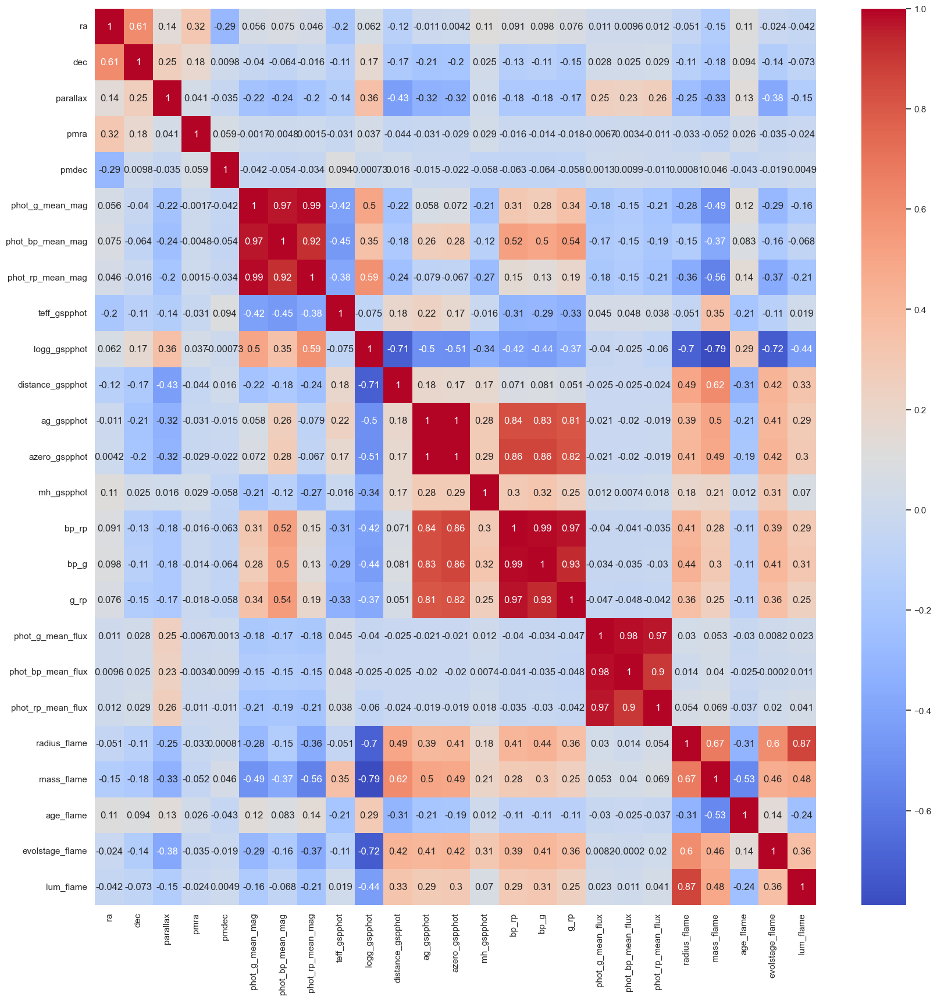

In [185]:
# Use a correlation matrix to assess the relationship between the features 
# and the target and multicollinearity between the features
plt.figure(figsize = (20,20))
sns.heatmap(Train_Valid_Dataset.corr(), annot = True, cmap = "coolwarm")  
plt.show()

In [212]:
## Brief Evaluation of the linear codependencies between features and targets:

From the correlation matrix above, the strongest indicators of a star's evolutionary age is it's
- Mass
- Radius
- Metallicity
- Color and Luminosity 

From the correlation matrix above, the strongest indicators of a star's age is it's
- Mass
- Radius
- Metallicity
- Temperature and Luminosity 

From the correlation matrix above, the strongest indicators of a star's lumonsity is it's 
- Mass
- Radius
- Metallicity
- Colour
- Extinction Factors

<Figure size 1500x1500 with 0 Axes>

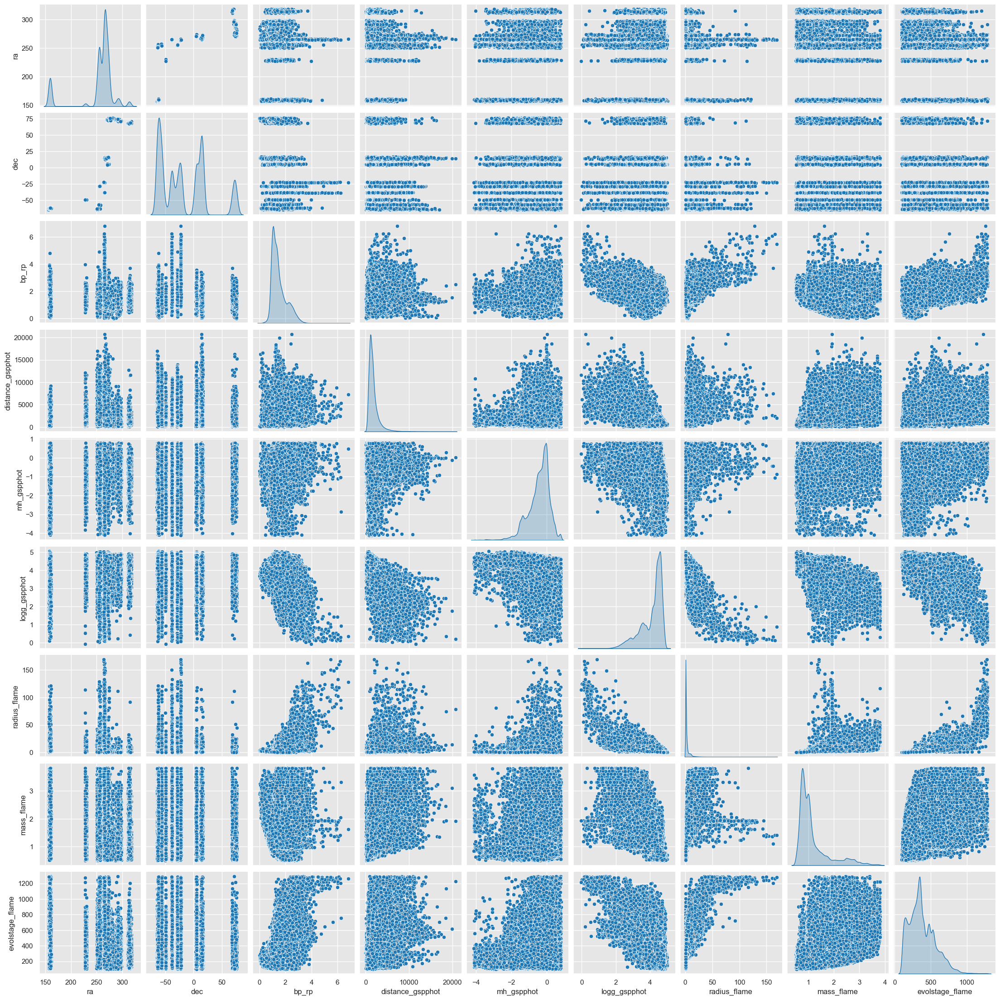

In [12]:
# The following code is used to create a pairplot of key features and targets of the dataset
plt.figure(figsize = (15,15))
sns.pairplot(Train_Valid_Dataset[["ra", "dec", "bp_rp", "distance_gspphot", "mh_gspphot", "logg_gspphot", "radius_flame", "mass_flame", "evolstage_flame"]], diag_kind = "kde")
plt.show()

array([[<Axes: title={'center': 'ra'}>, <Axes: title={'center': 'dec'}>,
        <Axes: title={'center': 'parallax'}>,
        <Axes: title={'center': 'pmra'}>,
        <Axes: title={'center': 'pmdec'}>],
       [<Axes: title={'center': 'phot_g_mean_mag'}>,
        <Axes: title={'center': 'phot_bp_mean_mag'}>,
        <Axes: title={'center': 'phot_rp_mean_mag'}>,
        <Axes: title={'center': 'teff_gspphot'}>,
        <Axes: title={'center': 'logg_gspphot'}>],
       [<Axes: title={'center': 'distance_gspphot'}>,
        <Axes: title={'center': 'ag_gspphot'}>,
        <Axes: title={'center': 'azero_gspphot'}>,
        <Axes: title={'center': 'mh_gspphot'}>,
        <Axes: title={'center': 'bp_rp'}>],
       [<Axes: title={'center': 'bp_g'}>,
        <Axes: title={'center': 'g_rp'}>,
        <Axes: title={'center': 'phot_g_mean_flux'}>,
        <Axes: title={'center': 'phot_bp_mean_flux'}>,
        <Axes: title={'center': 'phot_rp_mean_flux'}>],
       [<Axes: title={'center': 'radius

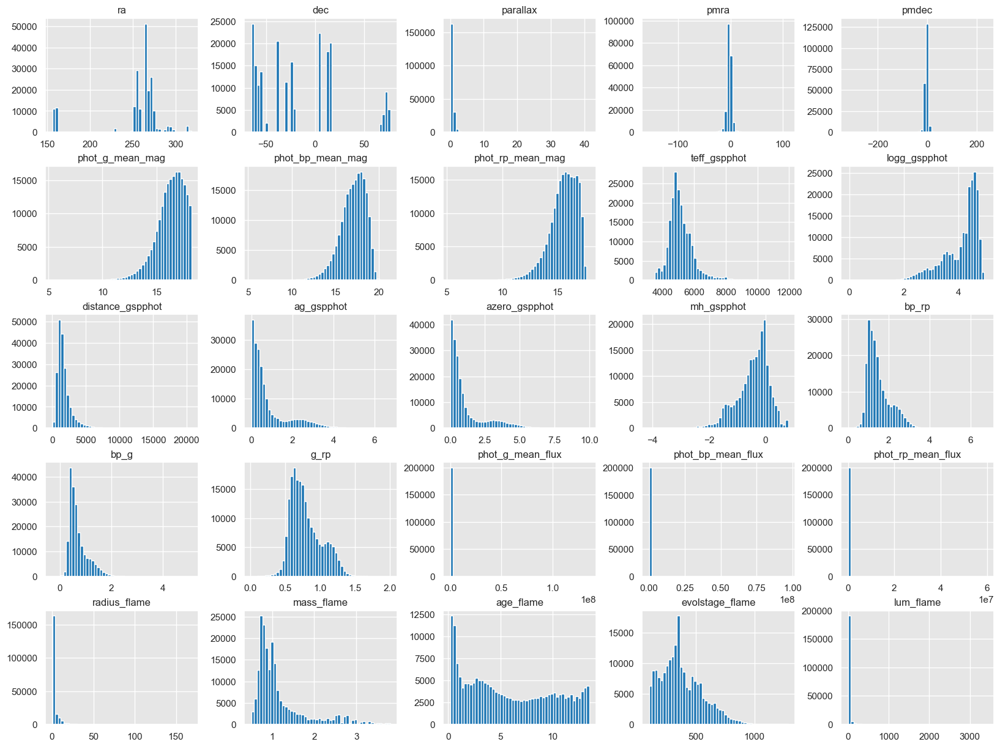

In [13]:
#The following code is used to analyse the distribution of the features and targets in the dataset
Train_Valid_Dataset.loc[:, Train_Valid_Dataset.columns != "evolstage_flame && age_flame && lum_flame"].hist(bins = 50, figsize = (20,15))

The mutual information scores are also reviewed alongside the correlation matrix and pairplots to get a clear view of the relationships between features and targets as well as the level of multicollinearity within the data.

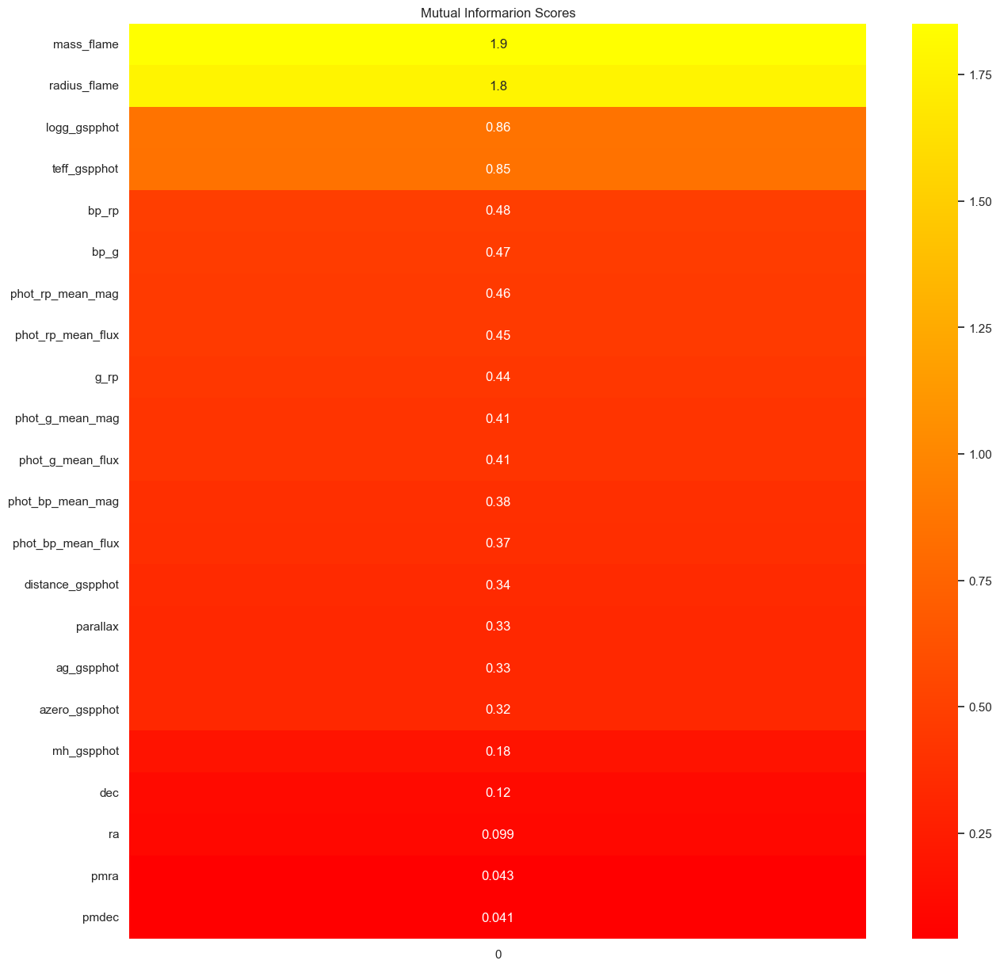

In [14]:
# The following code is used to create a visual diagram showing the mutual information scores of the features w.r.t
# to a particular target
plt.figure(figsize = (15,15))
mass_flame = make_mi_scores(Train_Valid_Dataset.iloc[:, :22], Train_Valid_Dataset.lum_flame, "auto")
plot_mi_scores(mass_flame)
plt.show()

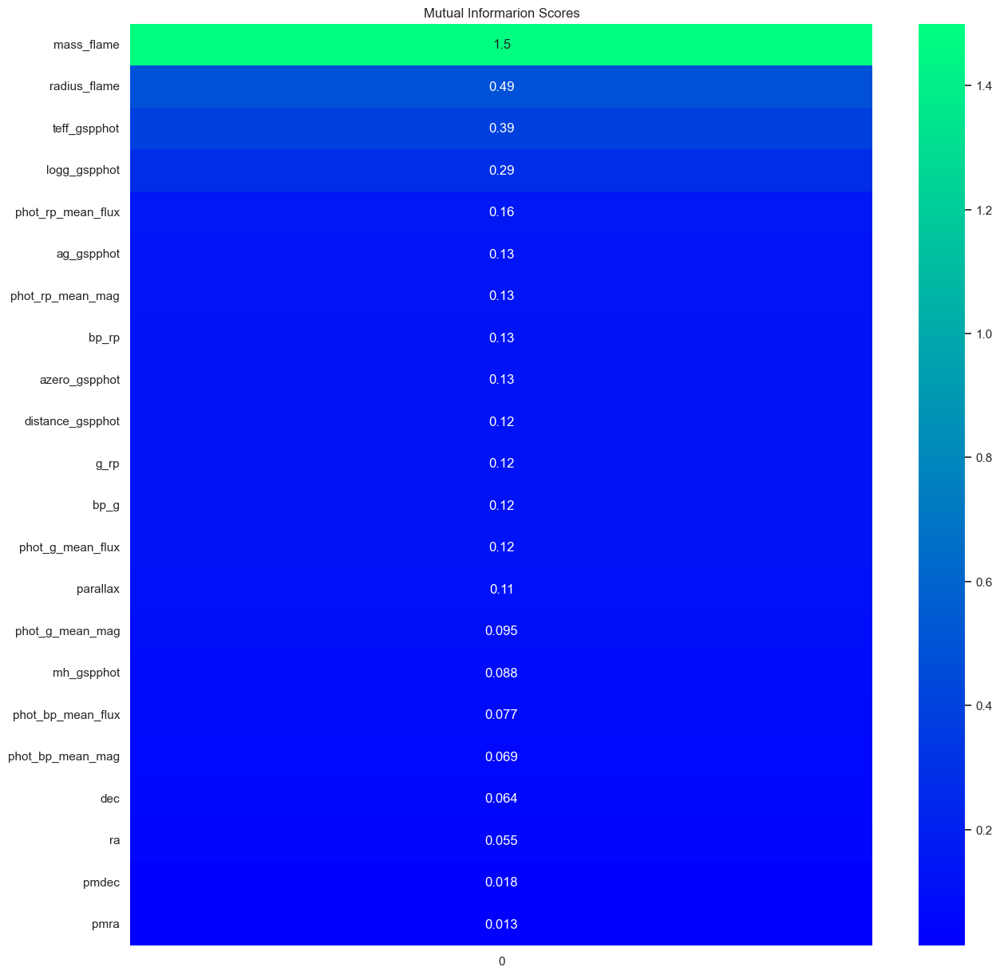

In [15]:
# The following code is used to create a visual diagram showing the mutual information scores of the features w.r.t
# to a particular target
plt.figure(figsize = (15,15))
age_flame = make_mi_scores(Train_Valid_Dataset.iloc[:, :22], Train_Valid_Dataset.age_flame, "auto")
plot_mi_scores(age_flame, cmap = "winter")
plt.show()

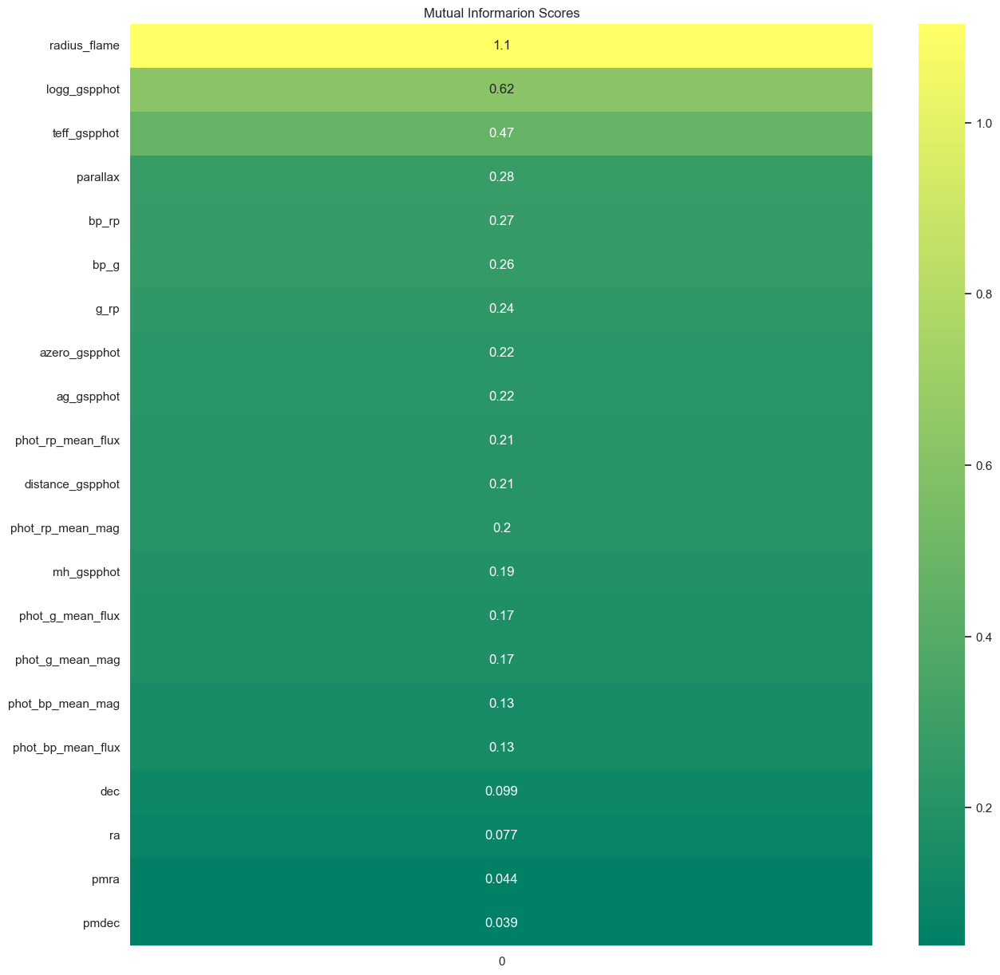

In [16]:
# The following code is used to create a visual diagram showing the mutual information scores of the features w.r.t
# to a particular target
plt.figure(figsize = (15,15))
evolstage_flame = make_mi_scores(Train_Valid_Dataset.iloc[:, :21], Train_Valid_Dataset.evolstage_flame, "auto")
plot_mi_scores(evolstage_flame, cmap = "summer")
plt.show()

In [203]:
# Splits the Train_Valid_Dataset into the Train and Validation datasets
Train_Dataset, Valid_Dataset = train_test_split(Train_Valid_Dataset, test_size = 0.2, random_state = 42)
Features, Targets = Train_Dataset.iloc[:, :22], Train_Dataset.iloc[:, 22:]
Valid_Features, Valid_Targets = Valid_Dataset.iloc[:, :22], Valid_Dataset.iloc[:, 22:]
Features.info(), Targets.info()

<class 'pandas.core.frame.DataFrame'>
Index: 160000 entries, 136412 to 210220
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   ra                 160000 non-null  float64
 1   dec                160000 non-null  float64
 2   parallax           160000 non-null  float64
 3   pmra               160000 non-null  float64
 4   pmdec              160000 non-null  float64
 5   phot_g_mean_mag    160000 non-null  float32
 6   phot_bp_mean_mag   160000 non-null  float32
 7   phot_rp_mean_mag   160000 non-null  float32
 8   teff_gspphot       160000 non-null  float32
 9   logg_gspphot       160000 non-null  float32
 10  distance_gspphot   160000 non-null  float32
 11  ag_gspphot         160000 non-null  float32
 12  azero_gspphot      160000 non-null  float32
 13  mh_gspphot         160000 non-null  float32
 14  bp_rp              160000 non-null  float32
 15  bp_g               160000 non-null  float32
 16  g_

(None, None)

array([[<Axes: title={'center': 'ra'}>, <Axes: title={'center': 'dec'}>,
        <Axes: title={'center': 'parallax'}>,
        <Axes: title={'center': 'pmra'}>,
        <Axes: title={'center': 'pmdec'}>],
       [<Axes: title={'center': 'phot_g_mean_mag'}>,
        <Axes: title={'center': 'phot_bp_mean_mag'}>,
        <Axes: title={'center': 'phot_rp_mean_mag'}>,
        <Axes: title={'center': 'teff_gspphot'}>,
        <Axes: title={'center': 'logg_gspphot'}>],
       [<Axes: title={'center': 'distance_gspphot'}>,
        <Axes: title={'center': 'ag_gspphot'}>,
        <Axes: title={'center': 'azero_gspphot'}>,
        <Axes: title={'center': 'mh_gspphot'}>,
        <Axes: title={'center': 'bp_rp'}>],
       [<Axes: title={'center': 'bp_g'}>,
        <Axes: title={'center': 'g_rp'}>,
        <Axes: title={'center': 'phot_g_mean_flux'}>,
        <Axes: title={'center': 'phot_bp_mean_flux'}>,
        <Axes: title={'center': 'phot_rp_mean_flux'}>],
       [<Axes: title={'center': 'radius

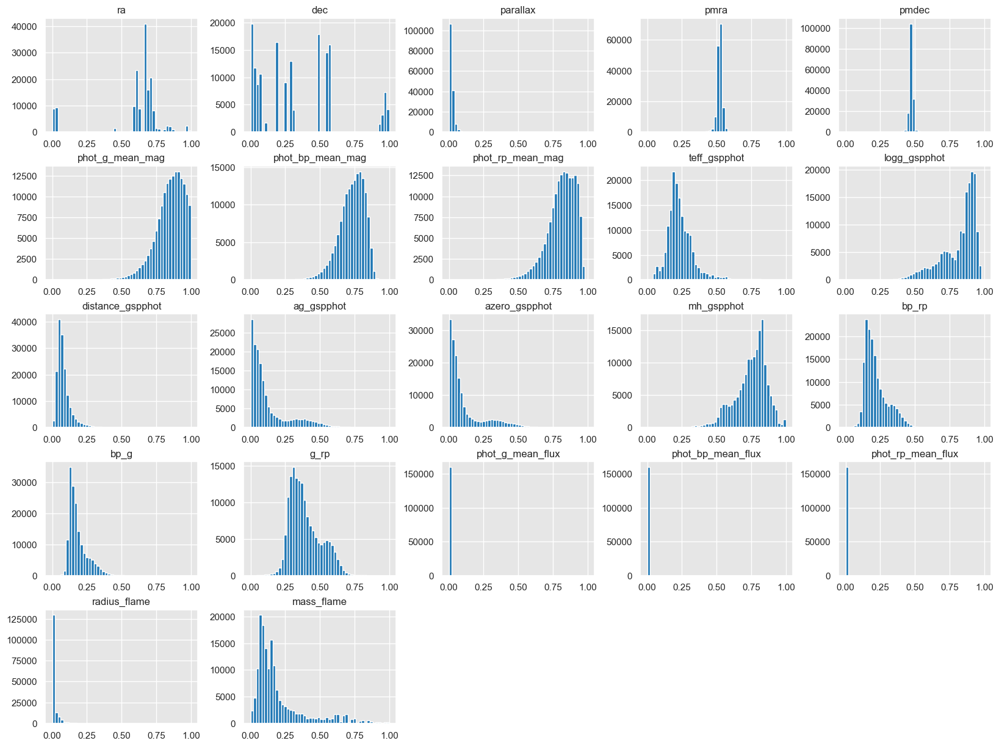

In [204]:
# Normalise the features of the Train dataset
Train_Normalised_Features = MinMaxScaler().fit_transform(Features)
Train_Normalised_Features = pd.DataFrame(Train_Normalised_Features, columns = Features.columns, index = Features.index)
Train_Normalised_Features.hist(bins = 50, figsize = (20,15))

array([[<Axes: title={'center': 'ra'}>, <Axes: title={'center': 'dec'}>,
        <Axes: title={'center': 'parallax'}>,
        <Axes: title={'center': 'pmra'}>,
        <Axes: title={'center': 'pmdec'}>],
       [<Axes: title={'center': 'phot_g_mean_mag'}>,
        <Axes: title={'center': 'phot_bp_mean_mag'}>,
        <Axes: title={'center': 'phot_rp_mean_mag'}>,
        <Axes: title={'center': 'teff_gspphot'}>,
        <Axes: title={'center': 'logg_gspphot'}>],
       [<Axes: title={'center': 'distance_gspphot'}>,
        <Axes: title={'center': 'ag_gspphot'}>,
        <Axes: title={'center': 'azero_gspphot'}>,
        <Axes: title={'center': 'mh_gspphot'}>,
        <Axes: title={'center': 'bp_rp'}>],
       [<Axes: title={'center': 'bp_g'}>,
        <Axes: title={'center': 'g_rp'}>,
        <Axes: title={'center': 'phot_g_mean_flux'}>,
        <Axes: title={'center': 'phot_bp_mean_flux'}>,
        <Axes: title={'center': 'phot_rp_mean_flux'}>],
       [<Axes: title={'center': 'radius

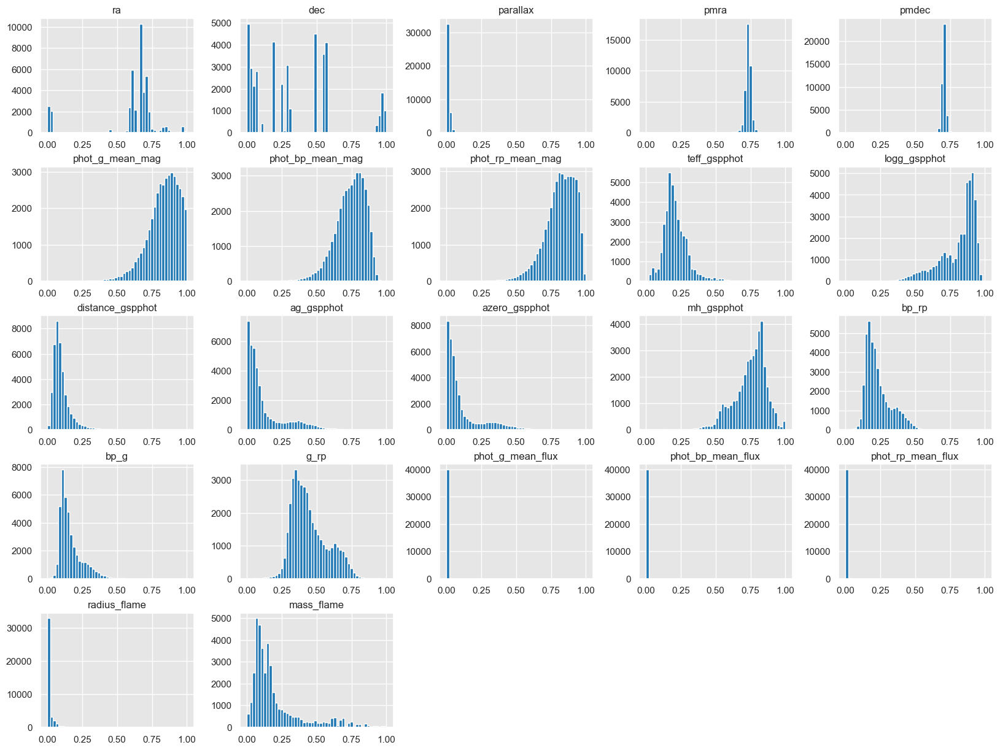

In [205]:
# Normalise the features of the Validation dataset
Valid_Normalised_Features = MinMaxScaler().fit_transform(Valid_Features)
Valid_Normalised_Features = pd.DataFrame(Valid_Normalised_Features, columns = Valid_Features.columns, index = Valid_Features.index)
Valid_Normalised_Features.hist(bins = 50, figsize = (20,15))

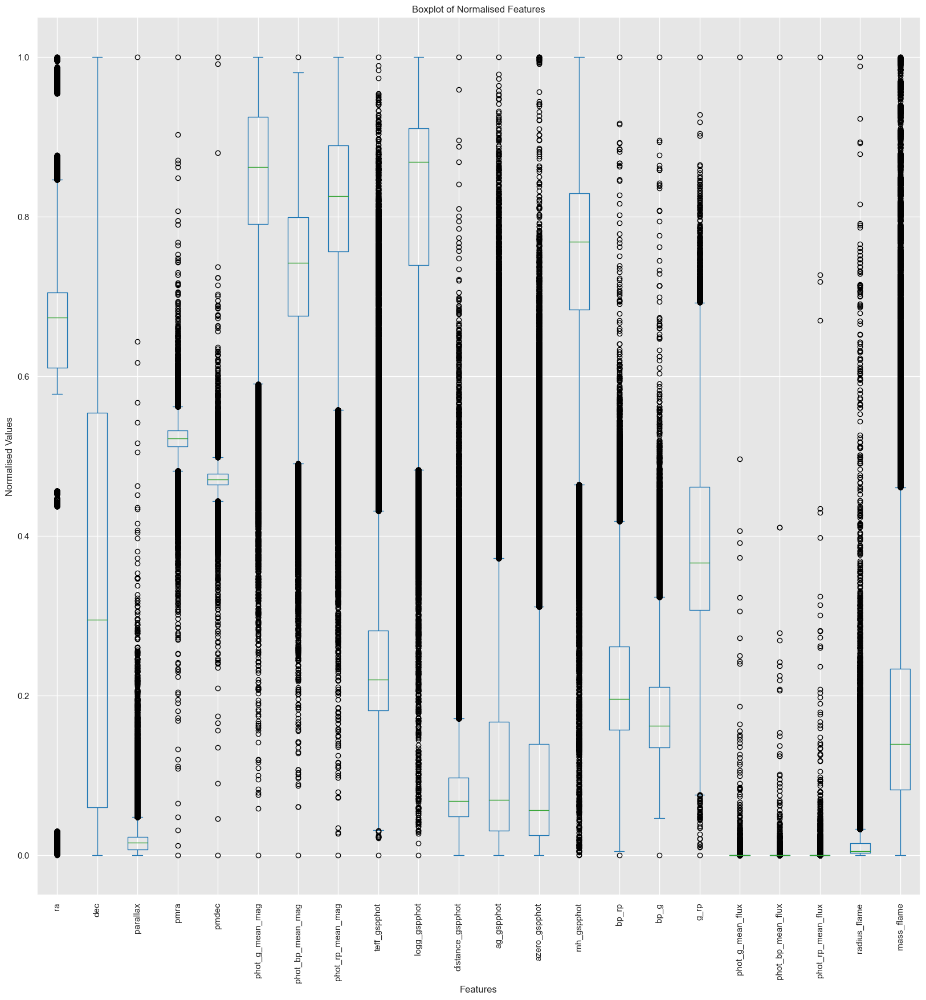

In [20]:
# Plot the Boxplot of the Normalised Features
Train_Normalised_Features.plot(kind = "box", figsize = (20,20))
plt.xticks(rotation = 90)
plt.xlabel("Features")
plt.ylabel("Normalised Values")
plt.title("Boxplot of Normalised Features")
plt.show()

# Training and Validation of Baseline Machine Learning Models and Feed-Forward Neural Network:
The LazyRegressor is used to train a host of ML regression models to predict the evolutionary stage, the age and the luminosity of the dataset of stars given geometric, photometric and spectroscopic data about the stars. The best model from the Lazy Regressor than acts as a point of comparison between the ML and DL models to determine whether the incorporation of a DL algorithm is necessary. \
The Baseline FeedForward Neural Network is defined using the Pytorch Lightning module and was adjusted during training through manual selection of it's hyperparameters to find the optimal configuration for the FFN to use as the baseline for the graphical neural network. This network was then trained and evaluated through metrics, and visualisations. 

In [22]:
# LazyRegressor is a module that allows for the quick training of multiple regression models. 
# These models are used as the baseline performance to compare the Deep-Learning models against. 
Regressor = LazyRegressor(verbose = 0, ignore_warnings = True, custom_metric = None)
Models, Predictions = Regressor.fit(Train_Normalised_Features, Valid_Normalised_Features, Targets, Valid_Targets)
Models

  0%|          | 0/42 [00:00<?, ?it/s]

100%|██████████| 42/42 [30:18<00:00, 43.30s/it] 


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
ExtraTreesRegressor,0.90,0.90,24.11,236.67
RandomForestRegressor,0.88,0.88,27.11,1262.36
BaggingRegressor,0.87,0.87,28.61,134.18
XGBRegressor,0.82,0.82,31.26,1.72
DecisionTreeRegressor,0.77,0.77,39.46,17.04
ExtraTreeRegressor,0.74,0.74,41.94,2.41
MLPRegressor,0.72,0.72,51.73,151.42
LassoLars,0.56,0.56,64.58,0.21
Lasso,0.56,0.56,64.60,3.05


In [263]:
# The following is code for creating a custom loss function for the model 
# and the feedforward neural network used as a baseline model for this experiemnt.
# The model is initialised and trained using the Pytorch Lightning module.

def rmsle(y_true, y_pred):
    """
    The Root Mean Square Error, computes the square root of the squared difference 
    between the log of the true values and the log of the predicted values.
    """
    return pt.sqrt(pt.mean(pt.square(pt.log1p(y_true) - pt.log1p(y_pred))))

class FeedForwardNetwork(L.LightningModule):
    """
    Outlines and defines the FeedForwardNetwork class which is a Pytorch Lightning Module.
    The class is used to define the architecture of the feedforward neural network.
    Also defines the training, validation and prediction steps of the model.
    """
    def __init__(self, input_size, hidden_size, output_size):
        super(FeedForwardNetwork, self).__init__()

        self.hidden_1 = nn.Linear(input_size, hidden_size)
        self.hidden_2 = nn.Linear(hidden_size, hidden_size)
        self.hidden_3 = nn.Linear(hidden_size, hidden_size)
        self.hidden_4 = nn.Linear(hidden_size, hidden_size)
        self.hidden_5 = nn.Linear(hidden_size, hidden_size)

        self.activation = nn.GELU()

        self.Normalisation1 = nn.BatchNorm1d(hidden_size)
        self.Normalisation2 = nn.BatchNorm1d(hidden_size)
        self.Normalisation3 = nn.BatchNorm1d(hidden_size)
        self.Normalisation4 = nn.BatchNorm1d(hidden_size)
        self.Normalisation5 = nn.BatchNorm1d(hidden_size)

        self.dropout = nn.Dropout(0.45)

        self.output = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):

        out = self.hidden_1(x)
        out = self.activation(out)
        out = self.Normalisation1(out)
        out = self.dropout(out)

        out = self.hidden_2(out)
        out = self.activation(out)
        out = self.Normalisation2(out)
        out = self.dropout(out)

        out = self.hidden_3(out)
        out = self.activation(out)
        out = self.Normalisation3(out)
        x = self.dropout(out)

        out = self.hidden_4(out)
        out = self.activation(out)
        out = self.Normalisation4(out)
        x = self.dropout(out)

        out = self.hidden_5(out)
        out = self.activation(out)
        out = self.Normalisation5(out)

        x = self.output(out)

        return x
    
    
    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self.forward(x)
        loss = torch.sqrt(F.mse_loss(y_hat, y))
        self.log("train_loss", loss, on_step = False, on_epoch = True, prog_bar = True, logger = True)
        return loss
    
    def configure_optimizers(self):
        optimiser = torch.optim.Adam(self.parameters(), lr = 0.001, weight_decay = 0.001)
        scheduler = {
            "scheduler": ReduceLROnPlateau(optimiser, mode = "min", factor = 0.1, patience = 5, verbose = True),
            "monitor": "val_loss"
        }
        return [optimiser], [scheduler]
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self.forward(x)
        loss = torch.sqrt(F.mse_loss(y_hat, y))
        self.log("val_loss", loss,  on_step = False, on_epoch = True, prog_bar = True, logger = True)
        return loss
    
    def test_step(self, batch, batch_idx):
        x,y = batch
        y_hat = self.forward(x)
        loss = torch.sqrt(F.mse_loss(y_hat, y))
        self.log("test_loss", loss, on_step = False, on_epoch = True, prog_bar = True, logger = True)
        return loss
    
    def predict_step(self, batch, batch_idx, dataloader_idx = 0):
        x, y = batch
        y_hat = self.forward(x)
        return y_hat

In [264]:
# Initialises a baseline model for the experiment
Base_NeuralNetwork = FeedForwardNetwork(22, 64, 3).to("cuda")
summary(Base_NeuralNetwork, (64,22))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1               [-1, 64, 64]           1,472
              GELU-2               [-1, 64, 64]               0
       BatchNorm1d-3               [-1, 64, 64]             128
           Dropout-4               [-1, 64, 64]               0
            Linear-5               [-1, 64, 64]           4,160
              GELU-6               [-1, 64, 64]               0
       BatchNorm1d-7               [-1, 64, 64]             128
           Dropout-8               [-1, 64, 64]               0
            Linear-9               [-1, 64, 64]           4,160
             GELU-10               [-1, 64, 64]               0
      BatchNorm1d-11               [-1, 64, 64]             128
          Dropout-12               [-1, 64, 64]               0
           Linear-13               [-1, 64, 64]           4,160
             GELU-14               [-1,

In [265]:
# Converts the train,validation datasets into tensors in the gpu and then into a DataLoader
Train_Features = torch.tensor(Train_Normalised_Features.values, dtype = torch.float32).to("cuda")
Valid_Features = torch.tensor(Valid_Normalised_Features.values, dtype= torch.float32).to("cuda")
Train_Targets = torch.tensor(Targets.values, dtype = torch.float32).to("cuda")
Valid_Target_set = torch.tensor(Valid_Targets.values, dtype = torch.float32).to("cuda")

Train_Dataset = TensorDataset(Train_Features, Train_Targets)
Valid_Dataset = TensorDataset(Valid_Features, Valid_Target_set)

Train_Loader = dataloader.DataLoader(Train_Dataset, batch_size = 128, shuffle = True)
Valid_Loader = dataloader.DataLoader(Valid_Dataset, batch_size = 128, shuffle = False)
Train_Loader, Valid_Loader

(<torch.utils.data.dataloader.DataLoader at 0x2a96a9e8390>,
 <torch.utils.data.dataloader.DataLoader at 0x2a96a9e86d0>)

In [266]:
# Define the Early stopping callback and the Learning Rate Monitor callback
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, verbose=True, mode='min')
lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint_callback = ModelCheckpoint(monitor='val_loss', save_top_k=1, mode='min', verbose=True)

# Defines the lightning trainer for the experiment and then trains the baseline model
Trainier = L.Trainer(max_epochs= 100, callbacks= [early_stopping_callback, lr_monitor, checkpoint_callback])
Trainier.fit(Base_NeuralNetwork, Train_Loader, Valid_Loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name           | Type        | Params
------------------------------------------------
0  | hidden_1       | Linear      | 1.5 K 
1  | hidden_2       | Linear      | 4.2 K 
2  | hidden_3       | Linear      | 4.2 K 
3  | hidden_4       | Linear      | 4.2 K 
4  | hidden_5       | Linear      | 4.2 K 
5  | activation     | GELU        | 0     
6  | Normalisation1 | BatchNorm1d | 128   
7  | Normalisation2 | BatchNorm1d | 128   
8  | Normalisation3 | BatchNorm1d | 128   
9  | Normalisation4 | BatchNorm1d | 128   
10 | Normalisation5 | BatchNorm1d | 128   
11 | dropout        | Dropout     | 0     
12 | output         | Linear      | 195   
------------------------------------------------
18.9 K    Trainable params
0         Non-trainable params
18.9 K    Total params
0.076     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 70.238
Epoch 0, global step 1250: 'val_loss' reached 70.23785 (best 70.23785), saving model to "c:\\Users\\kdarn\\OneDrive\\Documents\\Life's Portfolio\\Projects\\Machine Learning Personal Projects\\StellarRegression\\lightning_logs\\version_55\\checkpoints\\epoch=0-step=1250.ckpt" as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 28.540 >= min_delta = 0.0. New best score: 41.698
Epoch 1, global step 2500: 'val_loss' reached 41.69756 (best 41.69756), saving model to "c:\\Users\\kdarn\\OneDrive\\Documents\\Life's Portfolio\\Projects\\Machine Learning Personal Projects\\StellarRegression\\lightning_logs\\version_55\\checkpoints\\epoch=1-step=2500.ckpt" as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 4.620 >= min_delta = 0.0. New best score: 37.078
Epoch 2, global step 3750: 'val_loss' reached 37.07756 (best 37.07756), saving model to "c:\\Users\\kdarn\\OneDrive\\Documents\\Life's Portfolio\\Projects\\Machine Learning Personal Projects\\StellarRegression\\lightning_logs\\version_55\\checkpoints\\epoch=2-step=3750.ckpt" as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 5000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 1.820 >= min_delta = 0.0. New best score: 35.258
Epoch 4, global step 6250: 'val_loss' reached 35.25797 (best 35.25797), saving model to "c:\\Users\\kdarn\\OneDrive\\Documents\\Life's Portfolio\\Projects\\Machine Learning Personal Projects\\StellarRegression\\lightning_logs\\version_55\\checkpoints\\epoch=4-step=6250.ckpt" as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 7500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 8750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 10000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 11250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 12500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 13750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 15000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 16250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 17500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: 35.258. Signaling Trainer to stop.
Epoch 14, global step 18750: 'val_loss' was not in top 1


In [267]:
# Validates the model on the validation dataset
Trainier.test(Base_NeuralNetwork, Valid_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │     37.6591911315918      │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 37.6591911315918}]

In [268]:
# Generate predictions from the model
Predictions = Trainier.predict(Base_NeuralNetwork, Valid_Loader)
Predicted_Values = torch.vstack(Predictions).cpu().detach().numpy()
Predicted_Values.shape

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

(40000, 3)

In [269]:
# Print the R2 score and RMSE of the model
print(sk.metrics.r2_score(Valid_Targets, Predicted_Values), np.sqrt(sk.metrics.mean_squared_error(Valid_Targets, Predicted_Values)))

0.5214754430977103 50.41161189456993


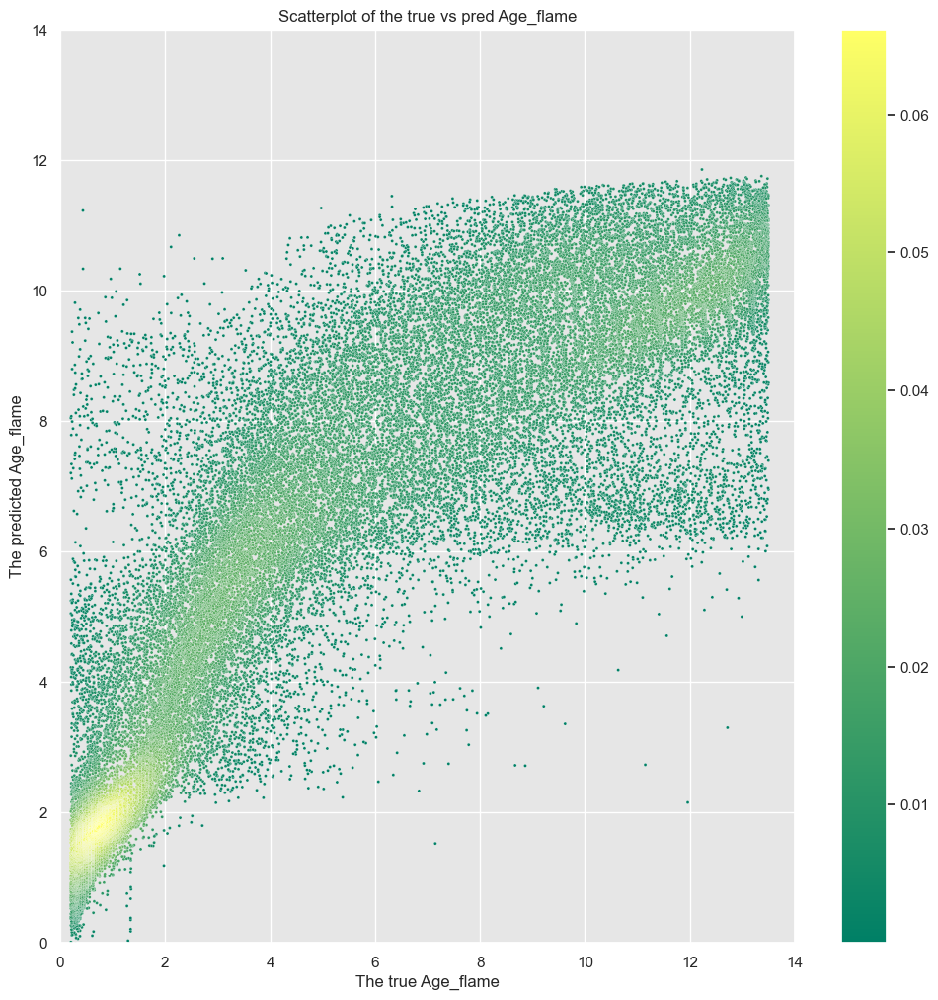

In [270]:
# Plot the Predicted Vs True values of the Age_flame
fig, ax = plt.subplots(figsize = (12,12))
x = Valid_Targets.values[:, 0]
y = Predicted_Values[:, 0]
grid = np.vstack([x, y])
z = gaussian_kde(grid)(grid)
idx = z.argsort()
x,y,z = x[idx], y[idx], z[idx]

im = sns.scatterplot(
    x = x,
    y = y,
    c = z,
    s = 5,
    cmap = "summer",
    )
norm = plt.Normalize(z.min(), z.max())
sm = plt.cm.ScalarMappable(cmap = "summer", norm = norm)
sm.set_array([])
im.figure.colorbar(sm)
ax.set_title("Scatterplot of the true vs pred Age_flame")
ax.set_xlabel("The true Age_flame")
ax.set_ylabel("The predicted Age_flame")
ax.set_ylim(0, 14)
ax.set_xlim(0, 14)
plt.show()

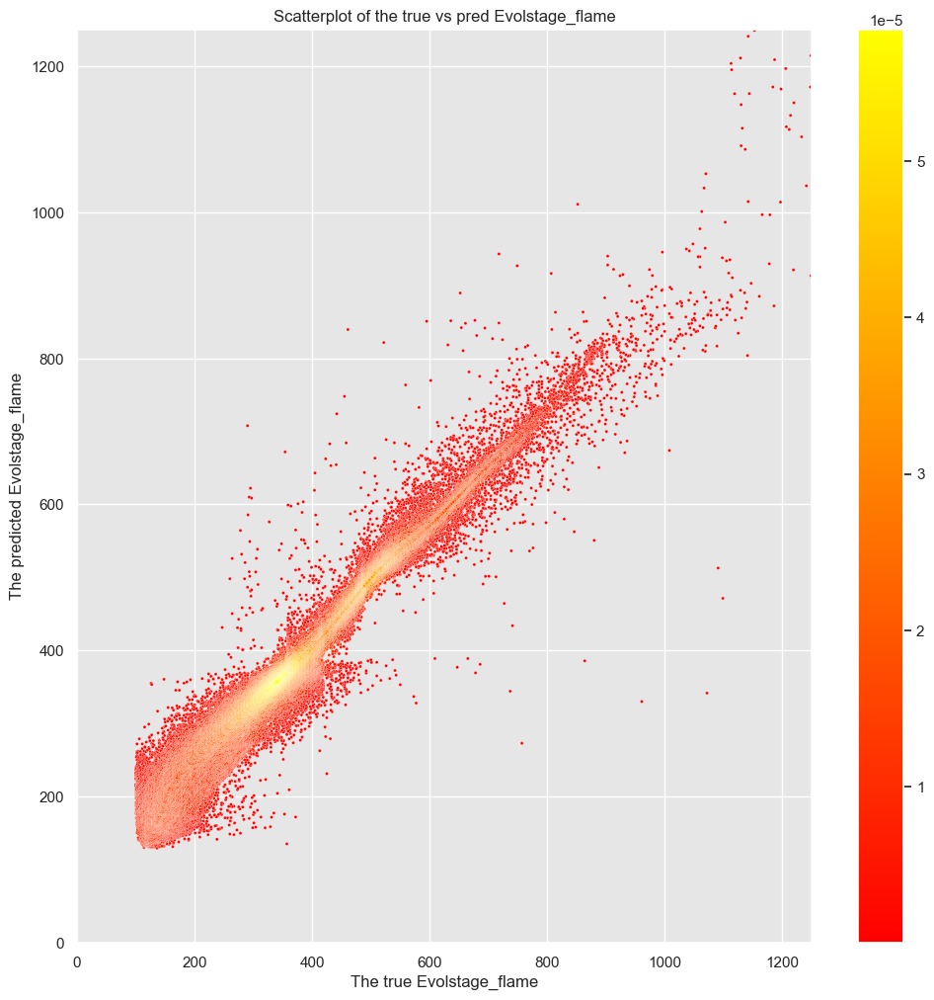

In [271]:
# Plot the Predicted Vs True values of the Evolstage_flame
fig, ax = plt.subplots(figsize = (12,12))
x = Valid_Targets.values[:, 1]
y = Predicted_Values[:, 1]
grid = np.vstack([x, y])
z = gaussian_kde(grid)(grid)
idx = z.argsort()
x,y,z = x[idx], y[idx], z[idx]

im = sns.scatterplot(
    x = x,
    y = y,
    c = z,
    s = 5,
    cmap = "autumn",
    )
norm = plt.Normalize(z.min(), z.max())
sm = plt.cm.ScalarMappable(cmap = "autumn", norm = norm)
sm.set_array([])
im.figure.colorbar(sm)
ax.set_title("Scatterplot of the true vs pred Evolstage_flame")
ax.set_xlabel("The true Evolstage_flame")
ax.set_ylabel("The predicted Evolstage_flame")
ax.set_ylim(0, 1250)
ax.set_xlim(0, 1250)
plt.show()

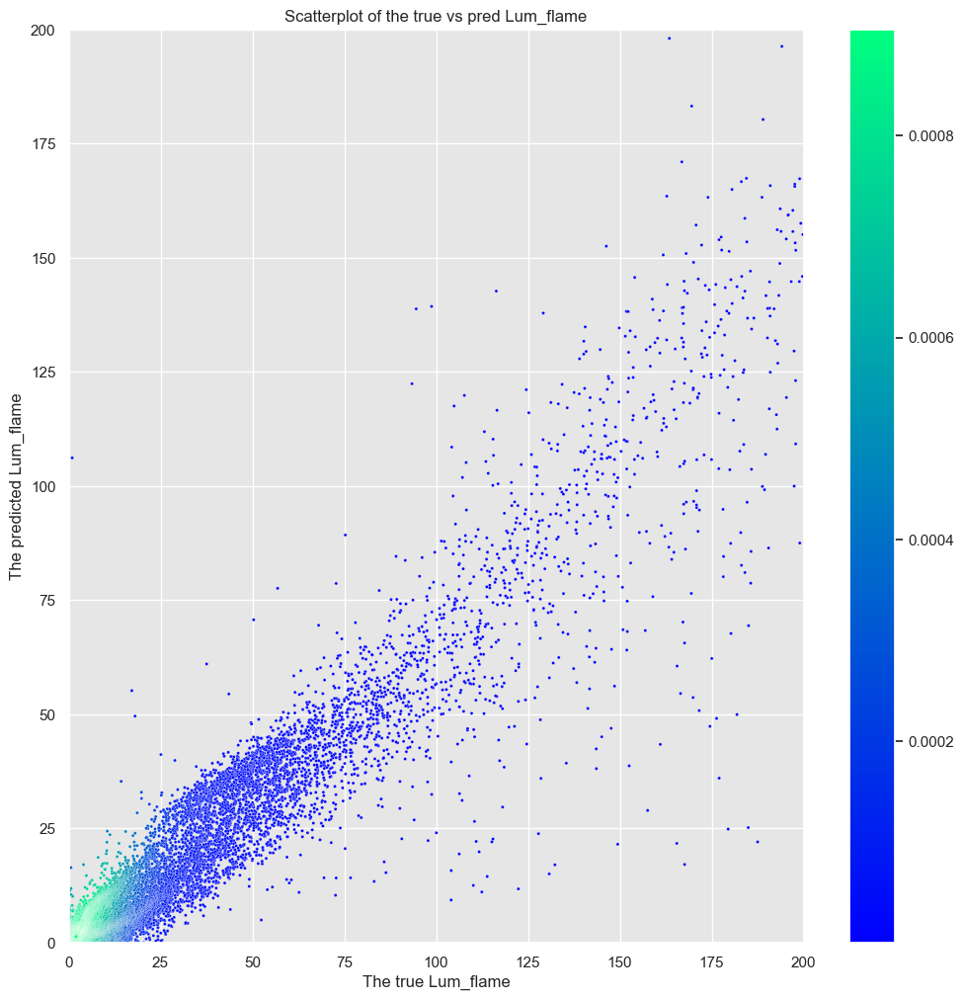

In [276]:
# Plot the Predicted Vs True values of the Lumstage_flame
fig, ax = plt.subplots(figsize = (12,12))
x = Valid_Targets.values[:, 2]
y = Predicted_Values[:, 2]
grid = np.vstack([x, y])
z = gaussian_kde(grid)(grid)
idx = z.argsort()
x,y,z = x[idx], y[idx], z[idx]

im = sns.scatterplot(
    x = x,
    y = y,
    c = z,
    s = 5,
    cmap = "winter",
    )
norm = plt.Normalize(z.min(), z.max())
sm = plt.cm.ScalarMappable(cmap = "winter", norm = norm)
sm.set_array([])
im.figure.colorbar(sm)
ax.set_title("Scatterplot of the true vs pred Lum_flame")
ax.set_xlabel("The true Lum_flame")
ax.set_ylabel("The predicted Lum_flame")
ax.set_ylim(0, 200)
ax.set_xlim(0, 200)
plt.show()

# Generating the Geometric Dataset for the Graph Neural Network
The main thesis of this experiment is that the prediction of the evolutionary stage and age of stars based on their features can be enhanced by grouping them into clusters that approximate the stellar clusters that stars typically reside in. The graph-based approach allows the consideration of the relationship between the stars, which provides additional context for the accurate determination of the star's age and evolutionary stage. The node-level regression allows the predictions for each individual star in the cluster leveraging both its features and its relationships with nearby stars. \
To form the graphs for the graph neural network, the K-Means algorithm is used to approximate the stellar clusters by grouping stars based on their 
- Right Ascension,
- Declination,
- Proper Motion Right Ascension,
- Proper Motion Declination,
- Distance From Earth.

This ensures that the clusters consist of groups of stars that are in the same position in the night sky and are moving together as a group, increasing the chance of the forming cluster being a stellar cluster of stars originating from the same stellar nursery. The cluster of stars were then transformed into a graph by connecting each star in the cluster with it's nearest k neighbours (A KNN Graph). The neighbourhood exists in the full feature space based on more than just geometric properties, including both the photometric and spectroscopic features. This means that the connections are formed with stars that are likely at a similar evolutionary stage, given they formed from the same stellar nursery and are close in the feature space. Exploratory Data Analysis is then done to ensure that that the process has not destroyed the correlations between the features and targets

In [70]:
# Splits the dataset into the features and targets
X = Dataset.drop(columns=["age_flame", "lum_flame", "evolstage_flame"])
y = Dataset[["age_flame", "evolstage_flame", "lum_flame"]]
X.info(), y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   ra                 250000 non-null  float64
 1   dec                250000 non-null  float64
 2   parallax           250000 non-null  float64
 3   pmra               250000 non-null  float64
 4   pmdec              250000 non-null  float64
 5   phot_g_mean_mag    250000 non-null  float32
 6   phot_bp_mean_mag   250000 non-null  float32
 7   phot_rp_mean_mag   250000 non-null  float32
 8   teff_gspphot       250000 non-null  float32
 9   logg_gspphot       250000 non-null  float32
 10  distance_gspphot   250000 non-null  float32
 11  ag_gspphot         250000 non-null  float32
 12  azero_gspphot      250000 non-null  float32
 13  mh_gspphot         250000 non-null  float32
 14  bp_rp              250000 non-null  float32
 15  bp_g               250000 non-null  float32
 16  g_

(None, None)

In [71]:
# Forms the clusters of the dataset using the KMeans algorithm. The clusters are formed based on the geometric features of the dataset.
X_Geometric = X[["ra", "dec", "distance_gspphot", "pmra", "pmdec"]]
X_Geometric_Standardized = StandardScaler().fit_transform(X_Geometric)
X_Geometric_Standardized = pd.DataFrame(X_Geometric_Standardized, columns = X_Geometric.columns)
n_clusters = len(X_Geometric_Standardized)//25

kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X_Geometric_Standardized)
X_Geometric_Standardized["cluster"] = kmeans.labels_
X_Geometric_Standardized

,ra,dec,distance_gspphot,pmra,pmdec,cluster
0,0.06,-0.28,0.75,-0.48,-0.47,7044
1,0.06,-0.28,-0.41,-0.14,0.43,5456
2,0.06,-0.28,0.52,-0.05,0.07,3110
3,0.06,-0.27,-0.57,-0.24,-0.15,982
4,0.06,-0.27,0.31,-0.69,-0.20,2245
...,...,...,...,...,...,...
249995,0.48,0.55,-0.75,0.27,-1.79,6694
249996,0.58,2.17,0.55,0.24,1.06,7472
249997,0.58,2.17,-0.97,0.92,0.23,3489
249998,0.57,2.17,-0.45,0.49,-0.98,3861


In [72]:
# Feature Engineering, used to create the proper motion vector magnitude.
X_Geometric_Standardized["PM"] = np.sqrt(X_Geometric_Standardized["pmra"]**2 + X_Geometric_Standardized["pmdec"]**2)

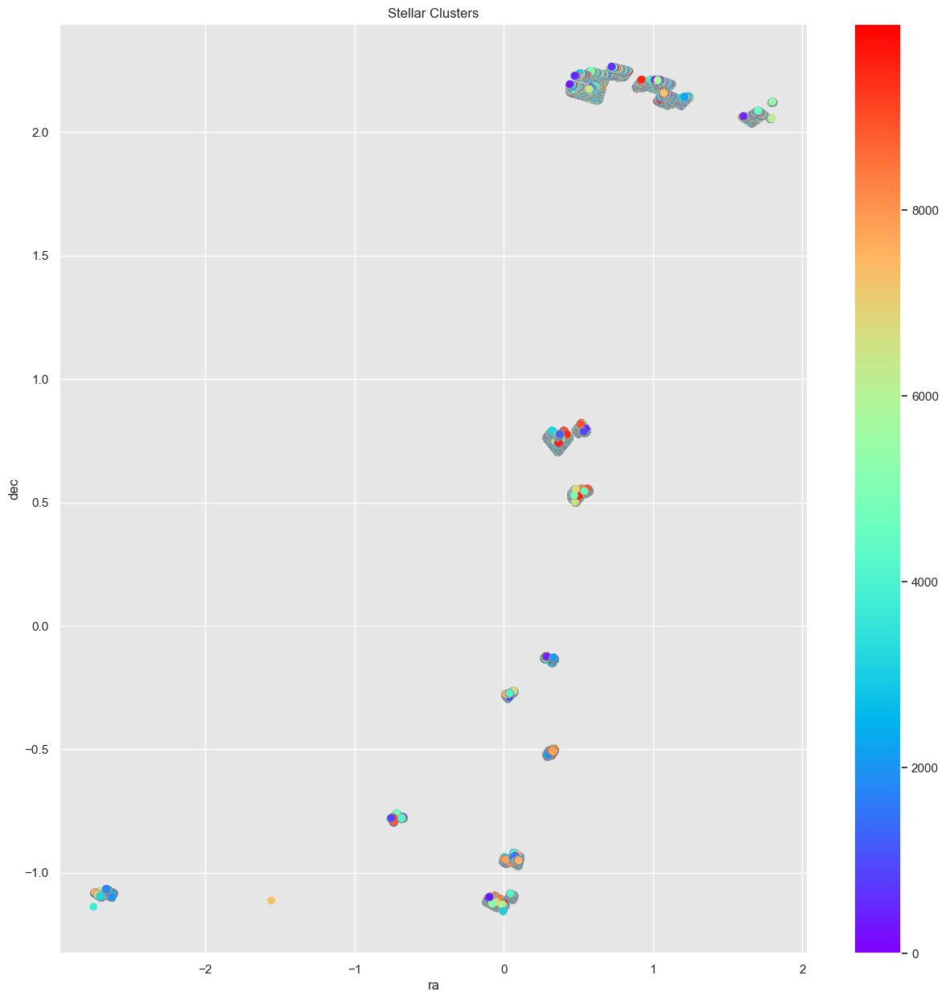

In [73]:
# Used to visualise the formed clusters in the ra/dec space.
plt.figure(figsize=(15, 15))
plt.scatter(X_Geometric_Standardized["ra"], X_Geometric_Standardized["dec"], c=X_Geometric_Standardized["cluster"], cmap='rainbow')
plt.xlabel("ra")
plt.ylabel("dec")
plt.title("Stellar Clusters")
colorbar = plt.cm.ScalarMappable(cmap='rainbow')
colorbar.set_array(X_Geometric_Standardized["cluster"])
plt.colorbar(colorbar)
plt.show()

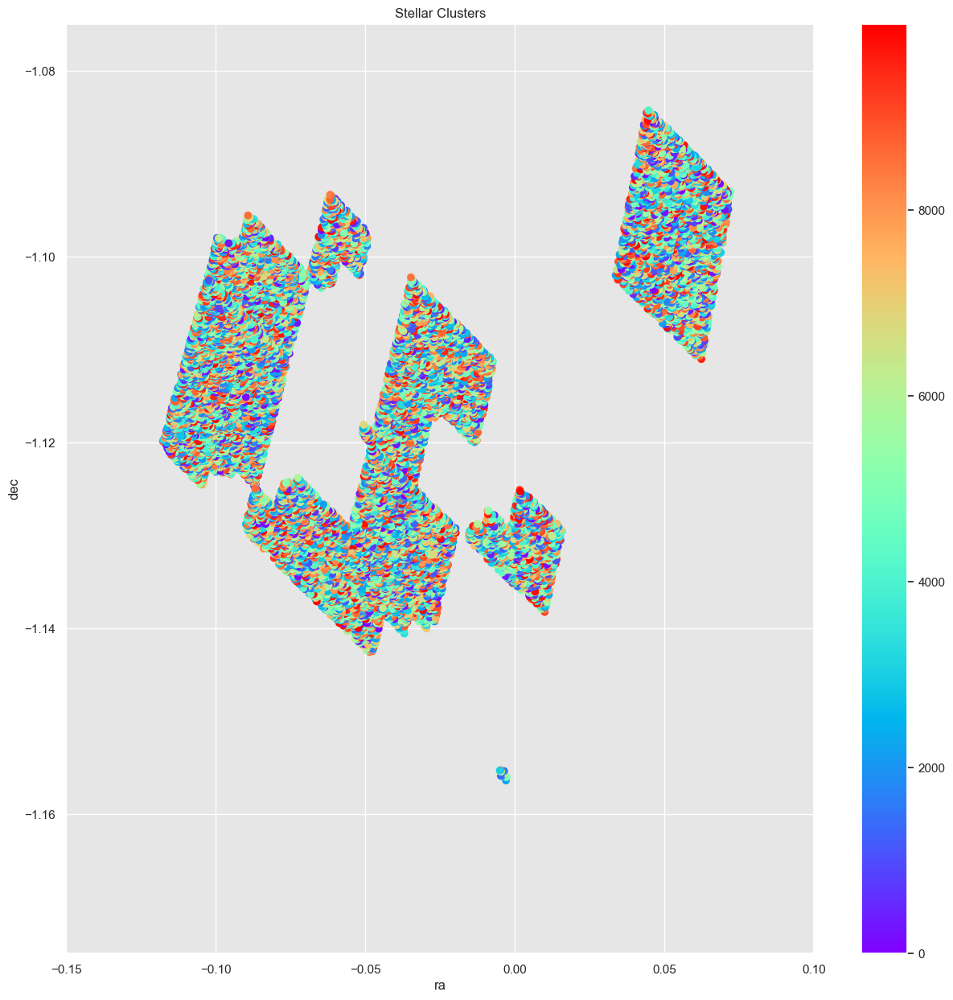

In [75]:
# The following code is used to create a graph of the clusters formed in the ra/dec space in a particular quadrant. 
plt.figure(figsize=(15, 15))
plt.scatter(X_Geometric_Standardized["ra"], X_Geometric_Standardized["dec"], c=X_Geometric_Standardized["cluster"], cmap='rainbow')
plt.xlabel("ra")
plt.ylabel("dec")
plt.title("Stellar Clusters")
colorbar = plt.cm.ScalarMappable(cmap='rainbow')
colorbar.set_array(X_Geometric_Standardized["cluster"])
plt.xlim(-0.15,0.10)
plt.ylim(-1.175,-1.075)
plt.colorbar(colorbar)
plt.show()

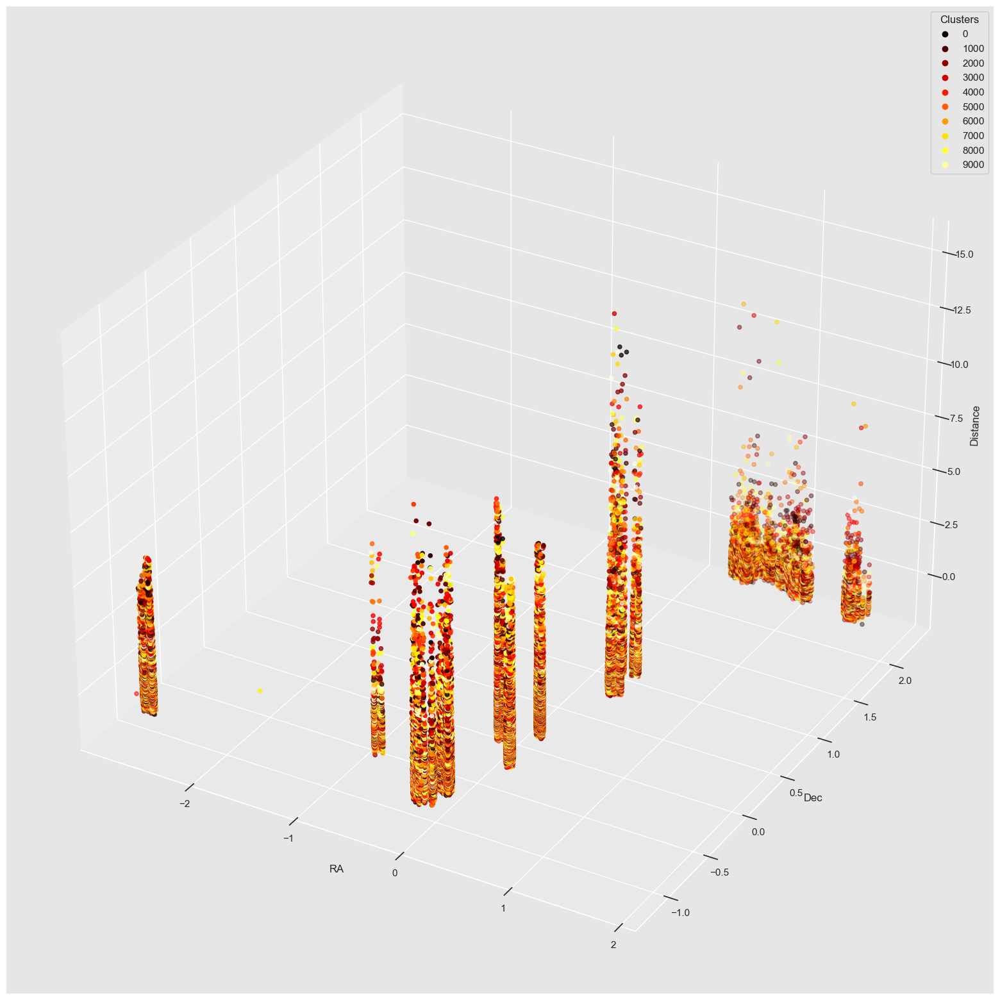

In [77]:
# The following code is used to create the 3D scatterplot of the star clusters in the ra/dec/distance space.
fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_Geometric_Standardized['ra'], X_Geometric_Standardized['dec'], X_Geometric_Standardized['distance_gspphot'], c=X_Geometric_Standardized['cluster'], cmap='hot')
legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
ax.set_xlabel('RA')
ax.set_ylabel('Dec')
ax.set_zlabel('Distance')
plt.show()


In [81]:
# The following code is used to create an interactive plotly graph of the 200th cluster in the ra/dec/distance space.
plt.figure(figsize=(15, 15))
cluster_num = 200
fig = px.scatter_3d(x = X_Geometric_Standardized.query(f"cluster == {cluster_num}")["ra"],y = X_Geometric_Standardized.query(f"cluster == {cluster_num}")["dec"], z = X_Geometric_Standardized.query(f"cluster == {cluster_num}")["distance_gspphot"],  color=X_Geometric_Standardized.query(f"cluster == {cluster_num}")["PM"])
fig.update_layout(title = f"Cluster {cluster_num}", scene = dict(xaxis_title='RA', yaxis_title='Dec', zaxis_title='Distance'), margin=dict(l=0, r=0, b=0, t=0))
fig.show()

<Figure size 1500x1500 with 0 Axes>

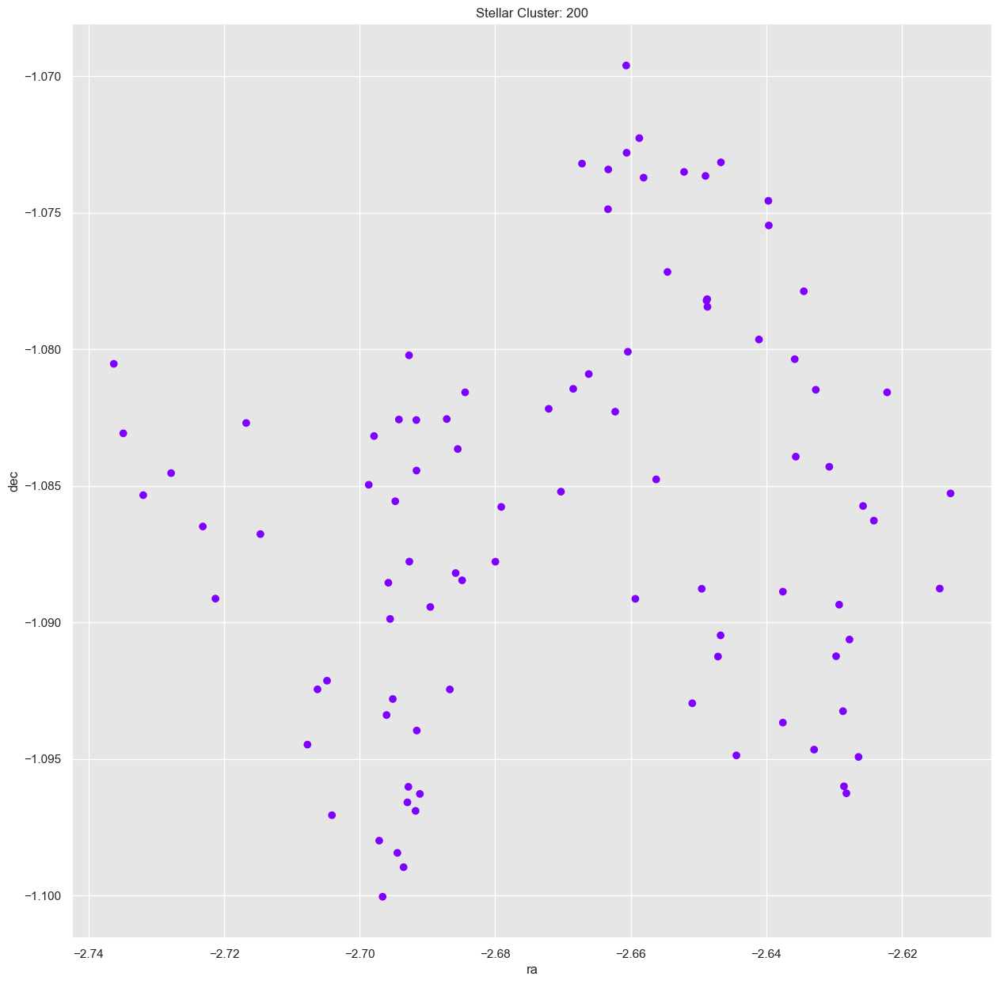

In [85]:
# The following code is used to create a 2D scatterplot of the 200th cluster above in the ra/dec space.
plt.figure(figsize=(15, 15))
cluster_num = 200
plt.scatter(X_Geometric_Standardized.query(f"cluster == {cluster_num}")["ra"], X_Geometric_Standardized.query(f"cluster == {cluster_num}")["dec"], c=X_Geometric_Standardized.query(f"cluster == {cluster_num}")["cluster"], cmap='rainbow')
plt.xlabel("ra")
plt.ylabel("dec")
plt.title(f"Stellar Cluster: {cluster_num}")
plt.show()

In [100]:
# The following code is a set of helper functions for creating and visualising the resulting graph of the clusters.
def knn_graph_generator(cluster_data, k):
    """
    Takes in a cluster of data and the number of nearest neighbors to consider. 
    Forms a graph of the cluster by connecting each point to its k nearest neighbors.
    Returns the graph of the cluster.
    """
    G = nx.Graph()
    neighbors = NearestNeighbors(n_neighbors=k, metric='euclidean', algorithm = "ball_tree").fit(cluster_data)
    distances, indices = neighbors.kneighbors(cluster_data)
    for i in range(len(cluster_data)):
        for j in range(1, k):
            G.add_edge(i, indices[i][j])

    return G

def nx_to_tg_data(G, features, targets):
    """
    A function used to convert networkx data to torch_geometric data.
    Takes in the Graph, features and targets of the data. Returns the torch_geometric tensor.
    """
    edge_index = torch.tensor(list(G.edges)).t().contiguous()
    x = torch.tensor(features.values).float()
    y = torch.tensor(targets.values).float()
    data = tg.data.Data(x=x, y = y, edge_index=edge_index)
    return data

def visualize_graph(data):
    """
    A function used to visualise the graph data.
    Takes in the torch_geometric data and visualises the graph.
    """
    G = to_networkx(data, to_undirected=True)
    pos = nx.spring_layout(G)
    plt.figure()
    edge_colors = np.array(list(range(data.edge_index.shape[1])))
    cmap = plt.cm.hot

    nx.draw_networkx_nodes(G, pos, node_size=50, node_color='blue')
    edges = nx.draw_networkx_edges(
        G,
        pos,
        edge_color=edge_colors,
        edge_cmap=cmap,
        alpha = 0.8,
        arrowsize = 10,
        width = 2,
    )
    pc = edges
    pc.set_array(edge_colors)

    ax = plt.gca()
    ax.figure.size_inches = (20, 20)
    #ax.set_axis_off()
    plt.colorbar(pc, ax=ax)
    plt.show()

In [92]:
# Used to check the number of clusters found by the KNN algorithm. 
print(len(X_Geometric_Standardized.cluster.unique()))

10000


In [93]:
# The following code is used to create the graph dataset of the clusters formed in the dataset.
X_Standardised = pd.DataFrame(StandardScaler().fit_transform(X), columns = X.columns)
cluster_num = 1 # Tracks the cluster number
neighbors_lim = 8 # Specifies the number of neighbors to consider
Graph_Dataset = []
while cluster_num <= X_Geometric_Standardized.cluster.max():
    cluster_data = X_Geometric_Standardized.query(f"cluster == {cluster_num}")
    cluster_features = X_Standardised.iloc[cluster_data.index]
    cluster_targets = y.iloc[cluster_data.index]
    neighbors = min(len(cluster_data), neighbors_lim)
    G = knn_graph_generator(cluster_data, k = neighbors)
    tg_data = nx_to_tg_data(G, cluster_features, cluster_targets)
    if len(tg_data.x) > 5:
        Graph_Dataset.append(tg_data)
    cluster_num += 1
Graph_Dataset

[Data(x=[32, 22], edge_index=[2, 139], y=[32, 3]),
 Data(x=[66, 22], edge_index=[2, 284], y=[66, 3]),
 Data(x=[43, 22], edge_index=[2, 196], y=[43, 3]),
 Data(x=[49, 22], edge_index=[2, 222], y=[49, 3]),
 Data(x=[17, 22], edge_index=[2, 79], y=[17, 3]),
 Data(x=[39, 22], edge_index=[2, 170], y=[39, 3]),
 Data(x=[18, 22], edge_index=[2, 80], y=[18, 3]),
 Data(x=[10, 22], edge_index=[2, 40], y=[10, 3]),
 Data(x=[45, 22], edge_index=[2, 196], y=[45, 3]),
 Data(x=[61, 22], edge_index=[2, 278], y=[61, 3]),
 Data(x=[33, 22], edge_index=[2, 148], y=[33, 3]),
 Data(x=[49, 22], edge_index=[2, 219], y=[49, 3]),
 Data(x=[19, 22], edge_index=[2, 84], y=[19, 3]),
 Data(x=[15, 22], edge_index=[2, 64], y=[15, 3]),
 Data(x=[15, 22], edge_index=[2, 66], y=[15, 3]),
 Data(x=[41, 22], edge_index=[2, 174], y=[41, 3]),
 Data(x=[35, 22], edge_index=[2, 157], y=[35, 3]),
 Data(x=[6, 22], edge_index=[2, 15], y=[6, 3]),
 Data(x=[88, 22], edge_index=[2, 377], y=[88, 3]),
 Data(x=[20, 22], edge_index=[2, 90], y=

66


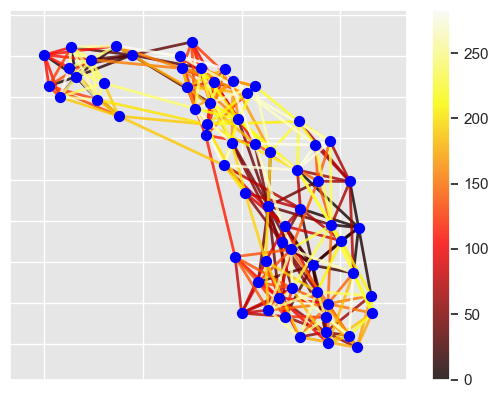

In [104]:
# Extracts the first graph from the dataset and visualises it.
data = Graph_Dataset[1]
print(len(data.x))
visualize_graph(data)

In [110]:
# Initialises the StellarGraphDataset class for the experiment. This class is defines the dataset for the experiment.
# Assuming graph_data_list is your list of torch_geometric.data.Data objects
class StellarGraphDataset(InMemoryDataset):
    def __init__(self, root, data_list=None, transform=None, pre_transform=None):
        self.data_list = data_list
        super(StellarGraphDataset, self).__init__(root, transform, pre_transform)
        self.data, self.slices = torch.load(self.processed_paths[0])

    @property
    def raw_file_names(self):
        return []

    @property
    def processed_file_names(self):
        return ['data.pt']

    def download(self):
        pass

    def process(self):
        if self.data_list is not None:
            data, slices = self.collate(self.data_list)
            torch.save((data, slices), self.processed_paths[0])

# Saves the dataset for later usage
dataset = StellarGraphDataset(root= r"C:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\Machine Learning Personal Projects\StellarRegression2", data_list=Graph_Dataset)
Stellar_Dataset = StellarGraphDataset(root= r"C:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\Machine Learning Personal Projects\StellarRegression2")

In [111]:
# Splits the graph data into the training, validation and test datasets. 
D_Train_Valid, D_Test = Stellar_Dataset[:int(len(Stellar_Dataset)*0.8)], Stellar_Dataset[int(len(Stellar_Dataset)*0.8):]
D_Train, D_Valid = train_test_split(D_Train_Valid, test_size=0.2)
len(D_Train), len(D_Valid), len(D_Test)

(5264, 1317, 1646)

In [124]:
# Extracts the features and targets of the train graph dataset as a flattened dataframe.
i = 0
Train_Dataset = np.array([])
Target_Dataset = np.array([])
for index in range(len(D_Train)-1):
    X = D_Train[index].x.numpy()
    y = D_Train[index].y.numpy()
    Train_Dataset = np.concatenate((Train_Dataset, X), axis=0) if Train_Dataset.size else X
    Target_Dataset = np.concatenate((Target_Dataset, y), axis=0) if Target_Dataset.size else y
Train_Dataset = pd.DataFrame(Train_Dataset, columns = Dataset.drop(columns= ["age_flame", "evolstage_flame", "lum_flame"]).columns)
Train_Target_Dataset = pd.DataFrame(Target_Dataset, columns = ["age_flame", "evolstage_flame", "lum_flame"])

In [125]:
# Extracts the features and targets of the validation graph dataset as a flattened dataframe.
i = 0
Valid_Dataset = np.array([])
Target_Dataset = np.array([])
for index in range(len(D_Valid)-1):
    X = D_Valid[index].x.numpy()
    y = D_Valid[index].y.numpy()
    Valid_Dataset = np.concatenate((Valid_Dataset, X), axis=0) if Valid_Dataset.size else X
    Target_Dataset = np.concatenate((Target_Dataset, y), axis=0) if Target_Dataset.size else y
Valid_Dataset = pd.DataFrame(Train_Dataset, columns = Dataset.drop(columns= ["age_flame", "evolstage_flame", "lum_flame"]).columns)
Valid_Target_Dataset = pd.DataFrame(Target_Dataset, columns = ["age_flame", "evolstage_flame", "lum_flame"])

In [132]:
# Checks the shape and features of train datasets
Train_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159548 entries, 0 to 159547
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   ra                 159548 non-null  float32
 1   dec                159548 non-null  float32
 2   parallax           159548 non-null  float32
 3   pmra               159548 non-null  float32
 4   pmdec              159548 non-null  float32
 5   phot_g_mean_mag    159548 non-null  float32
 6   phot_bp_mean_mag   159548 non-null  float32
 7   phot_rp_mean_mag   159548 non-null  float32
 8   teff_gspphot       159548 non-null  float32
 9   logg_gspphot       159548 non-null  float32
 10  distance_gspphot   159548 non-null  float32
 11  ag_gspphot         159548 non-null  float32
 12  azero_gspphot      159548 non-null  float32
 13  mh_gspphot         159548 non-null  float32
 14  bp_rp              159548 non-null  float32
 15  bp_g               159548 non-null  float32
 16  g_

In [143]:
# Combines the features and targets into a single dataset
Data = pd.concat([Train_Dataset, Train_Target_Dataset], axis=1)
Data.head(5)

,ra,dec,parallax,pmra,pmdec,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,teff_gspphot,logg_gspphot,...,bp_g,g_rp,phot_g_mean_flux,phot_bp_mean_flux,phot_rp_mean_flux,radius_flame,mass_flame,age_flame,evolstage_flame,lum_flame
0,0.05,-0.96,1.53,-0.58,1.03,1.29,1.37,1.17,-1.42,0.90,...,0.83,1.05,-0.05,-0.04,-0.06,-0.47,-0.94,2.72,182.00,0.06
1,0.07,-0.96,2.22,-0.71,0.97,1.02,1.37,0.72,-1.71,0.41,...,1.82,1.99,-0.05,-0.04,-0.06,-0.43,-0.96,13.27,273.00,0.08
2,0.06,-0.93,1.18,-0.66,1.14,1.00,1.15,0.85,-1.16,0.72,...,1.01,1.09,-0.05,-0.04,-0.06,-0.42,-0.82,6.93,299.00,0.14
3,0.10,-0.97,2.15,-0.71,0.83,0.21,0.33,0.04,-1.01,0.86,...,0.58,1.00,-0.04,-0.04,-0.05,-0.43,-0.78,4.02,296.00,0.15
4,0.10,-0.94,1.99,-0.67,1.05,0.17,0.27,0.09,-1.01,0.85,...,0.45,0.54,-0.04,-0.04,-0.05,-0.43,-0.78,6.57,275.00,0.15


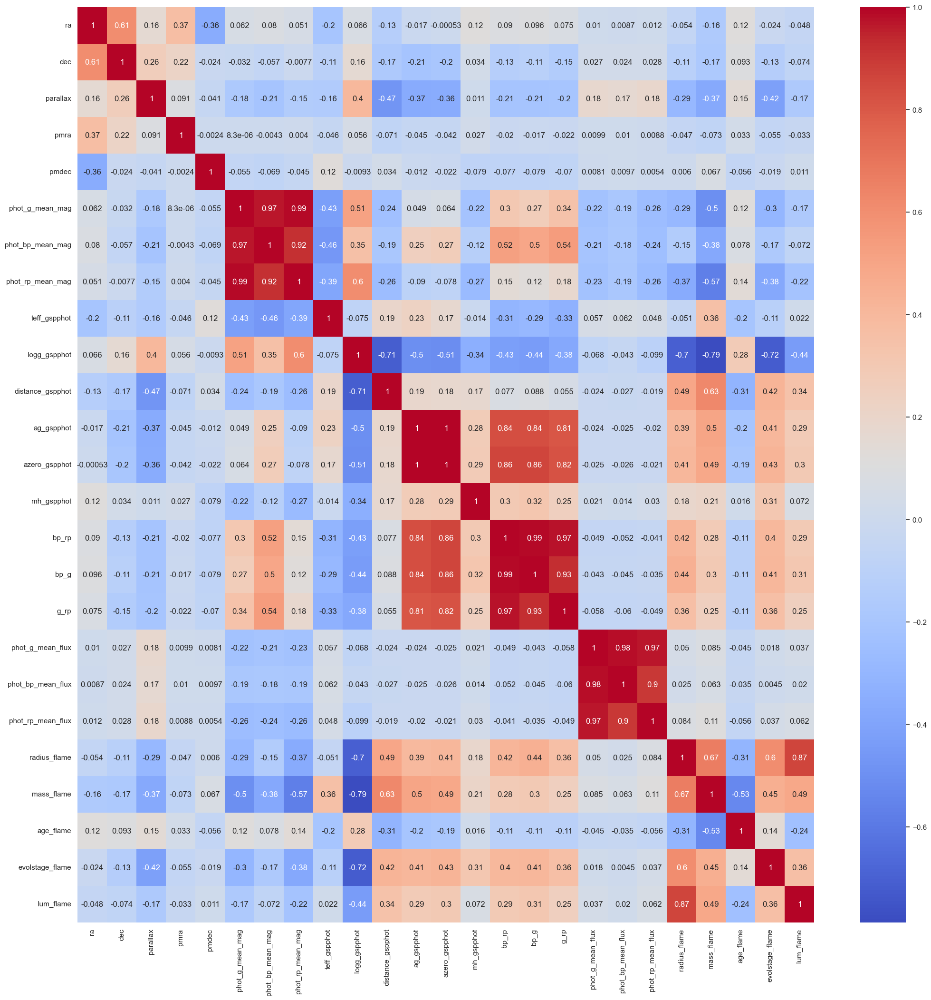

In [183]:
# Plots the Correlation matrix of the graph dataset to ensure that it rmeains unchanged by the process.
plt.figure(figsize = (25,25))
sns.heatmap(Data.corr(), annot = True, cmap = "coolwarm")  
plt.show()

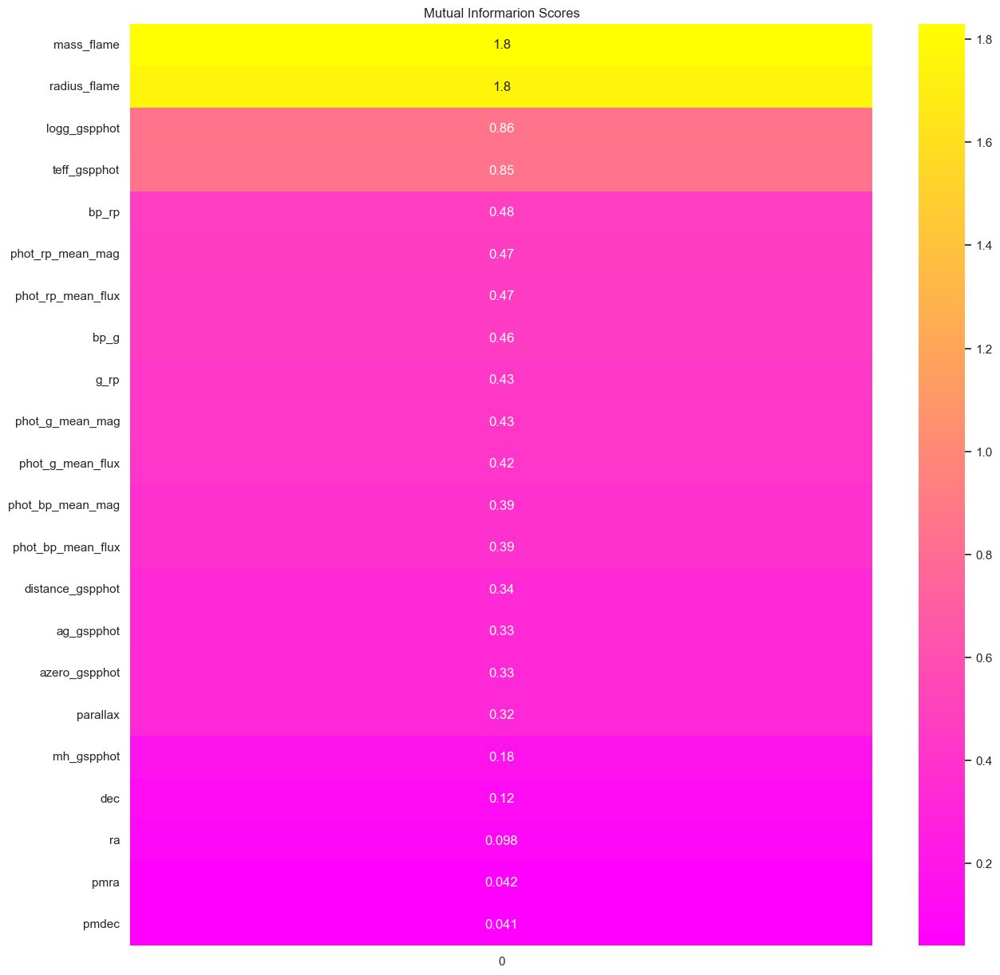

In [134]:
# Plots the mutual information scores between the features and the luminosity target to ensure that the process has not affected the data.
plt.figure(figsize = (15,15))
lum_flame = make_mi_scores(Train_Dataset, Train_Target_Dataset.lum_flame, "auto")
plot_mi_scores(lum_flame, cmap = "spring")
plt.show()

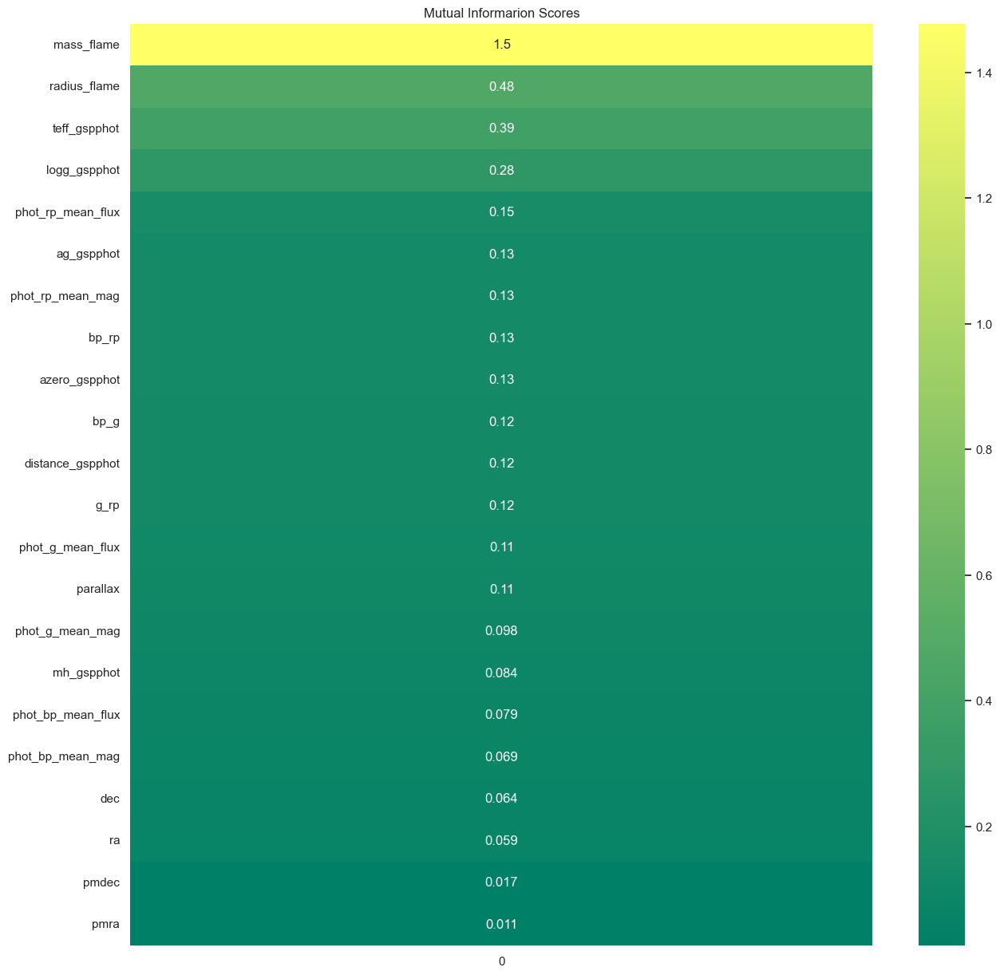

In [135]:
# Plots the mutual information scores between the features and age target to ensure that the process has not affected the data.
plt.figure(figsize = (15,15))
age_flame = make_mi_scores(Train_Dataset, Train_Target_Dataset.age_flame, "auto")
plot_mi_scores(age_flame, cmap = "summer")
plt.show()

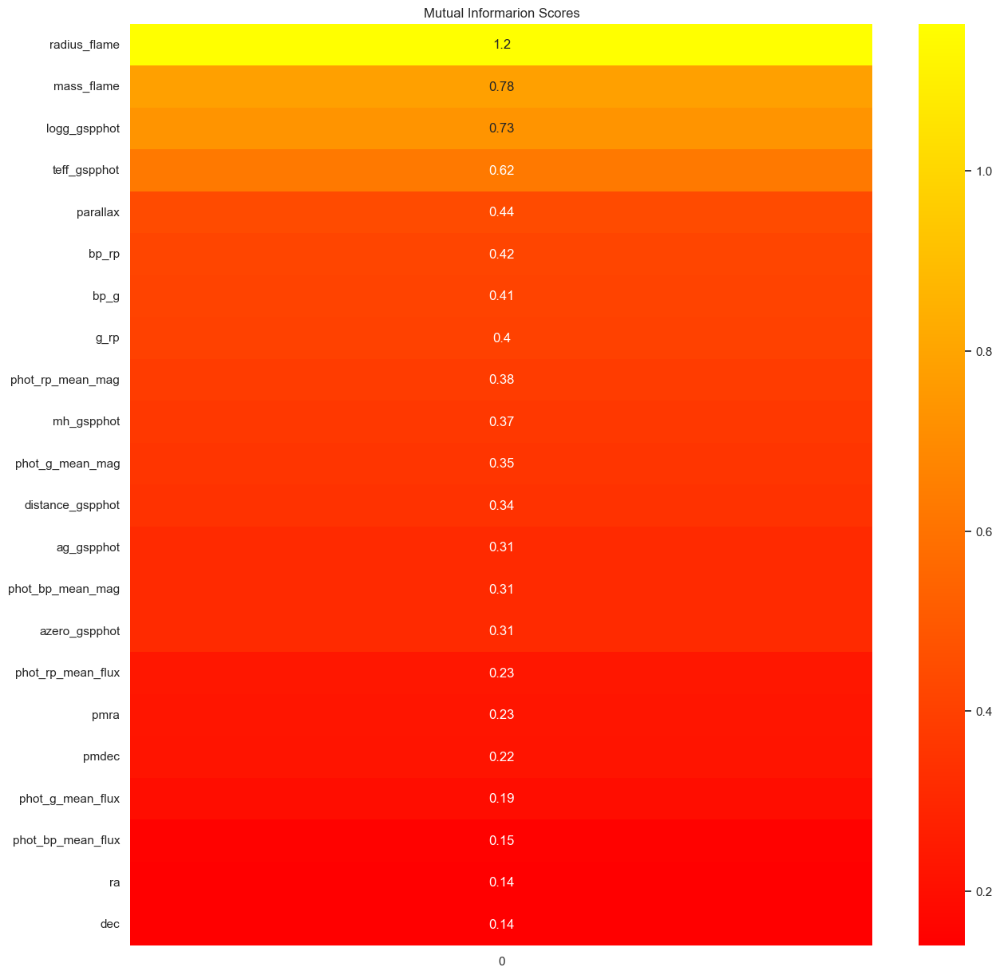

In [136]:
# Plots the mutual information scores between the features and the evolutionary stage target to ensure that the process has not affected the data.
plt.figure(figsize = (15,15))
evolstage_flame = make_mi_scores(Train_Dataset, Train_Target_Dataset.evolstage_flame, "auto")
plot_mi_scores(evolstage_flame, cmap = "autumn")
plt.show()

# Training and Developing the Graph Neural Network:
With the Graphs formed the next task is to define and train the neural network architecture capable of leveraging the graph structure of the formed clusters. A graph neural network is a model which takes in a graph represented by it's Node Embedding Matrix X, an Edge Embedding Matrix E, and an Adjacency Matrix A as inputs and then passes it through a series of L layers to create and progressively update a new representation of the inputted graph. These updates to the representation continue until the node (and potentially edge) embeddings of the graph contain information not just about the individual node (or edge) but also about it's context within the graph. It is this additional context that the neural network learns and adds through the application of the intermediate layers. \
For this task, we are considering a node level regression task where the neural network is required to predict the evolutionary stage, age and luminosity of the individual stars in each of the graphs using the node/edge embedding and the structure of the graph. \
To achieve this, the GraphSage (Graph Sample and Aggregation) framework is utilised. It is a framework that was designed to address the limitations of it's contemporary Graph Neural Network models, particular in terms of scalability and generalisation to unsee nodes or graphs. GraphSage is a powerful framework for learning node embeddings in large and dynamic graphs such as the ones utilised in this experiment. Its inductive learning ability, the ability to generate embeddings for nodes that were not present during training, coupled with it's flexible and efficient neighbourhood aggregation methods, makes it suitable for a wide range of graph-based tasks. 
## The Key Aspects of GraphSage:
1. Inductive Learning: Unlike transductive learning, which requires the entire graph during both training and inference, inductive learning allows the model to generate embeddings for new nodes or graphs that were not seen during training. This is crucial for applications where the graph is constantly evolving or too large to fit into memory. 
2. Neighbourhood Sampling: Instead of aggregating features from all neighbours of a node, GraphSAGE samples a fixed-size set of neighbours. This sampling helps in handling large graphs efficiently and makes the computation tractable.
3. Aggregation functions: GraphSAGE introduces various aggregation functions to combine the features of node neighbours. These functions can be mean, LSTM-based or pooling based, providing flexibility in how neighbourhood information is aggregated.

In [137]:
# Defines the Graph Neural Network model for the experiment. The model is defined using the Pytorch Lightning module.
class StellarGraphSage(L.LightningModule):
    """
    Defines the StellarGraphSage class which is a Pytorch Lightning Module.
    The class is used to define the architecture of the Graph Neural Network.
    Also defines the training, validation and prediction steps of the model.
    """
    def __init__(self, in_features, hidden_features, out_features):
        super(StellarGraphSage, self).__init__()
        self.conv1 = SAGEConv(in_features, hidden_features)
        self.conv2 = SAGEConv(hidden_features, hidden_features, normalize=False)
        self.conv3 = SAGEConv(hidden_features, hidden_features, normalize=False)
        self.GraphNorm_1 = GraphNorm(hidden_features)
        self.GraphNorm_2 = GraphNorm(hidden_features)
        self.GraphNorm_3 = GraphNorm(hidden_features)
        self.activation = nn.GELU()
        self.conv4 = SAGEConv(hidden_features, out_features)
    
    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x1 = self.conv1(x, edge_index)
        x1 = self.GraphNorm_1(x1)
        x1 = self.activation(x1)

        x2 = self.conv2(x1, edge_index)
        x2 = self.GraphNorm_2(x2)
        x2 = self.activation(x2+x1)

        x3 = self.conv3(x2, edge_index)
        x3 = self.GraphNorm_3(x3)
        x3 = self.activation(x3+x2)
        
        x4 = self.conv4(x3, edge_index)
        return x4
    
    def training_step(self, batch, batch_idx):
        data = batch
        y_hat = self.forward(data)
        loss = torch.sqrt(F.mse_loss(y_hat, data.y))
        self.log("train_loss", loss, on_step = False, on_epoch = True, prog_bar = True, logger = True)
        return loss
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr = 0.01, weight_decay= 0.001)
    
    def validation_step(self, batch, batch_idx):
        data = batch
        y_hat = self.forward(data)
        loss = torch.sqrt(F.mse_loss(y_hat, data.y))
        self.log("val_loss", loss,  on_step = False, on_epoch = True, prog_bar = True, logger = True)
        return loss
    
    def test_step(self, batch, batch_idx):
        data = batch
        y_hat = self.forward(data)
        loss = torch.sqrt(F.mse_loss(y_hat, data.y))
        self.log("test_loss", loss, on_step = False, on_epoch = True, prog_bar = True, logger = True)
        return loss
    
    def predict_step(self, batch, batch_idx, dataloader_idx = 0):
        x = batch
        y_hat = self.forward(x)
        return y_hat

In [147]:
# Initialises a GraphSage Neural Network
Graph_NeuralNetwork = StellarGraphSage(22,128, 3).to("cuda")
Graph_NeuralNetwork

StellarGraphSage(
  (conv1): SAGEConv(22, 128, aggr=mean)
  (conv2): SAGEConv(128, 128, aggr=mean)
  (conv3): SAGEConv(128, 128, aggr=mean)
  (GraphNorm_1): GraphNorm(128)
  (GraphNorm_2): GraphNorm(128)
  (GraphNorm_3): GraphNorm(128)
  (activation): GELU(approximate='none')
  (conv4): SAGEConv(128, 3, aggr=mean)
)

In [148]:
# Converts the train,validation datasets into tensors and loads them onto the gpu and then into a DataLoader
from torch_geometric.loader import DataLoader
Geometric_Train_Loader = DataLoader(D_Train, batch_size = 32, shuffle = True)
Geometric_Valid_Loader = DataLoader(D_Valid, batch_size = 32, shuffle = False)
Geometric_Test_Loader = DataLoader(D_Test, batch_size = 32, shuffle = False)
Geometric_Train_Loader

In [150]:
# Define the callbacks
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, verbose=True, mode='min')
lr_monitor = LearningRateMonitor(logging_interval='step')

# Defines the Pytorch Lightning Trainer for the experiment and then trains the Graph Neural Network model.
Trainier2 = L.Trainer(max_epochs= 100, callbacks= [early_stopping_callback, lr_monitor],accelerator="auto")
Trainier2.fit(Graph_NeuralNetwork, Geometric_Train_Loader, Geometric_Valid_Loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type      | Params
------------------------------------------
0 | conv1       | SAGEConv  | 5.8 K 
1 | conv2       | SAGEConv  | 32.9 K
2 | conv3       | SAGEConv  | 32.9 K
3 | GraphNorm_1 | GraphNorm | 384   
4 | GraphNorm_2 | GraphNorm | 384   
5 | GraphNorm_3 | GraphNorm | 384   
6 | activation  | GELU      | 0     
7 | conv4       | SAGEConv  | 771   
------------------------------------------
73.5 K    Trainable params
0         Non-trainable params
73.5 K    Total params
0.294     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 21.351


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 21.320


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.420 >= min_delta = 0.0. New best score: 20.901


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.115 >= min_delta = 0.0. New best score: 20.786


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 20.765


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.392 >= min_delta = 0.0. New best score: 20.373


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: 20.373. Signaling Trainer to stop.


In [153]:
# Returns the rmse of the model on the validation dataset
Trainier.test(Graph_NeuralNetwork, Geometric_Valid_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │     21.0722599029541      │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 21.0722599029541}]

In [155]:
# Returns the rmse of the model on the test dataset
Trainier.test(Graph_NeuralNetwork, Geometric_Test_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    20.352537155151367     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 20.352537155151367}]

In [162]:
# Flattens the targets of the validation dataset loader to obtain a dataframe of the validation targets
Flattened_Valid_Test_Dataset = np.zeros((1,3))
print(len(Geometric_Valid_Loader))
i = 0
for element in Geometric_Valid_Loader:
    for ele in element.y.numpy():
        ele = ele.reshape(1,3)
        Flattened_Valid_Test_Dataset = np.concatenate((Flattened_Valid_Test_Dataset, ele), axis=0) if Flattened_Valid_Test_Dataset.size else ele
    i+=1
Flattened_Valid_Test_Dataset = pd.DataFrame(Flattened_Valid_Test_Dataset[1:], columns = ["age_flame", "evolstage_flame", "lum_flame"])
Flattened_Valid_Test_Dataset

42


,age_flame,evolstage_flame,lum_flame
0,3.70,145.00,0.17
1,12.41,368.00,0.32
2,11.74,385.00,0.28
3,3.38,126.00,0.08
4,11.99,334.00,0.24
...,...,...,...
38995,0.74,130.00,1.18
38996,4.15,186.00,0.18
38997,13.43,358.00,0.73
38998,0.97,137.00,0.94


In [163]:
# Flattens the targets of the test dataset loader to obtain a dataframe of the test targets
Flattened_Test_Test_Dataset = np.zeros((1,3))
print(len(Geometric_Test_Loader))
i = 0
for element in Geometric_Test_Loader:
    for ele in element.y.numpy():
        ele = ele.reshape(1,3)
        Flattened_Test_Test_Dataset = np.concatenate((Flattened_Test_Test_Dataset, ele), axis=0) if Flattened_Test_Test_Dataset.size else ele
    i+=1
Flattened_Test_Test_Dataset = pd.DataFrame(Flattened_Test_Test_Dataset[1:], columns = ["age_flame", "evolstage_flame", "lum_flame"])
Flattened_Test_Test_Dataset

52


,age_flame,evolstage_flame,lum_flame
0,8.68,261.00,0.12
1,7.14,284.00,0.12
2,1.78,125.00,0.22
3,12.86,383.00,0.38
4,4.06,171.00,0.22
...,...,...,...
46602,4.12,185.00,0.18
46603,3.52,229.00,0.12
46604,4.65,256.00,0.16
46605,6.96,274.00,0.56


In [170]:
# Extracts the predictions of the model on the validation dataset
Predictions = Trainier.predict(Graph_NeuralNetwork, Geometric_Valid_Loader)
Predicted_Values = torch.vstack(Predictions).cpu().detach().numpy()
Predicted_Values.shape

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

(39000, 3)

In [172]:
# Returns the r2 score for the model's predictions vs the true values.
sk.metrics.r2_score(Flattened_Valid_Test_Dataset, Predicted_Values)

0.8873799617103666

In [173]:
# Returns the RMSE of the model's predictions vs the true values.
np.sqrt(sk.metrics.mean_squared_error(Flattened_Valid_Test_Dataset, Predicted_Values))

21.488937744458635

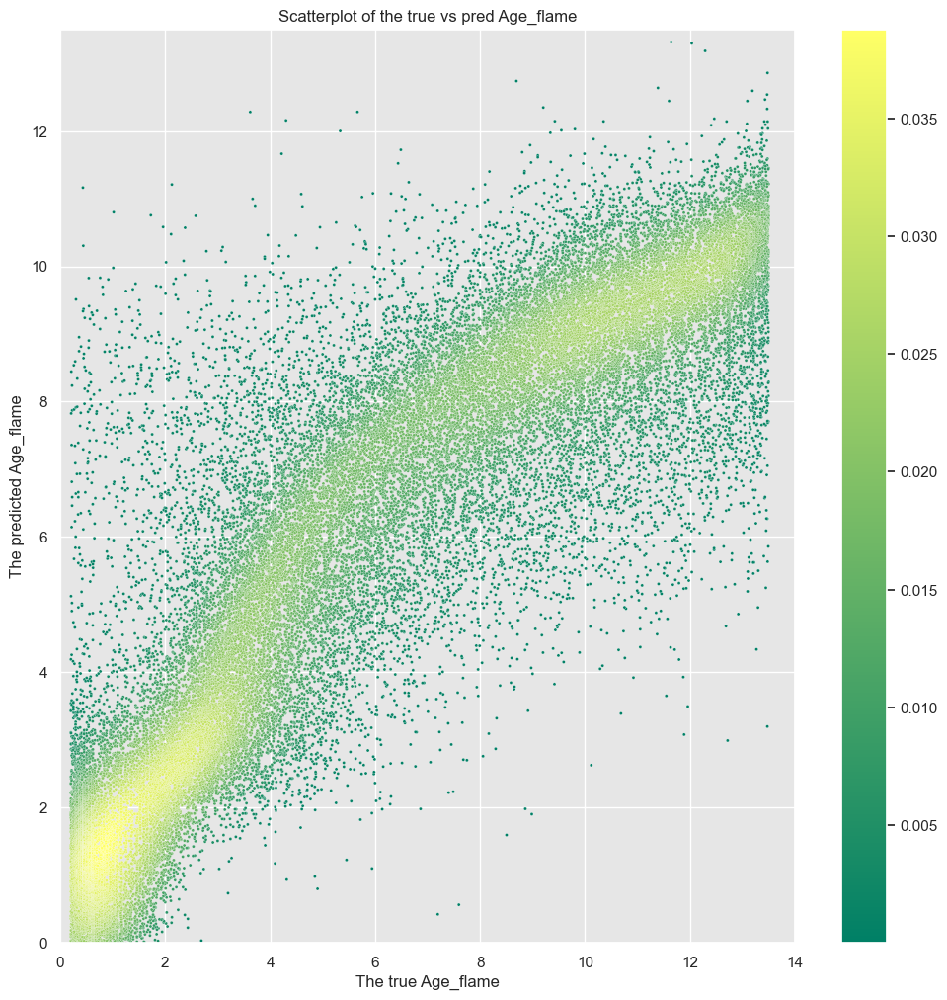

In [177]:
# Plot the Predicted Vs True values of the Age_flame
fig, ax = plt.subplots(figsize = (12,12))
x = Flattened_Valid_Test_Dataset.values[:, 0]
y = Predicted_Values[:, 0]
grid = np.vstack([x, y])
z = gaussian_kde(grid)(grid)
idx = z.argsort()
x,y,z = x[idx], y[idx], z[idx]

im = sns.scatterplot(
    x = x,
    y = y,
    c = z,
    s = 5,
    cmap = "summer",
    )
norm = plt.Normalize(z.min(), z.max())
sm = plt.cm.ScalarMappable(cmap = "summer", norm = norm)
sm.set_array([])
im.figure.colorbar(sm)
ax.set_title("Scatterplot of the true vs pred Age_flame")
ax.set_xlabel("The true Age_flame")
ax.set_ylabel("The predicted Age_flame")
ax.set_ylim(0, 13.5)
ax.set_xlim(0, 14)
plt.show()

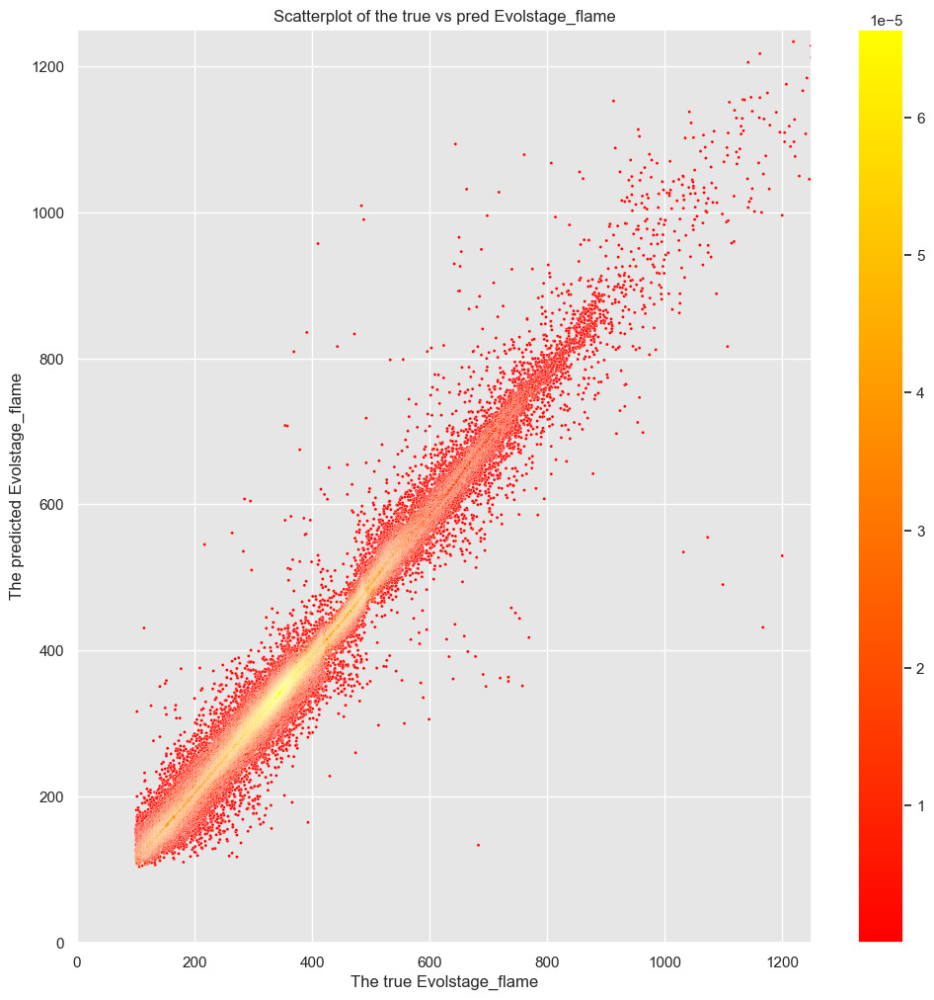

In [179]:
# Plot the Predicted Vs True values of the Evolstage_flame
fig, ax = plt.subplots(figsize = (12,12))
x = Flattened_Valid_Test_Dataset.values[:, 1]
y = Predicted_Values[:, 1]
grid = np.vstack([x, y])
z = gaussian_kde(grid)(grid)
idx = z.argsort()
x,y,z = x[idx], y[idx], z[idx]

im = sns.scatterplot(
    x = x,
    y = y,
    c = z,
    s = 5,
    cmap = "autumn",
    )
norm = plt.Normalize(z.min(), z.max())
sm = plt.cm.ScalarMappable(cmap = "autumn", norm = norm)
sm.set_array([])
im.figure.colorbar(sm)
ax.set_title("Scatterplot of the true vs pred Evolstage_flame")
ax.set_xlabel("The true Evolstage_flame")
ax.set_ylabel("The predicted Evolstage_flame")
ax.set_ylim(0, 1250)
ax.set_xlim(0, 1250)
plt.show()

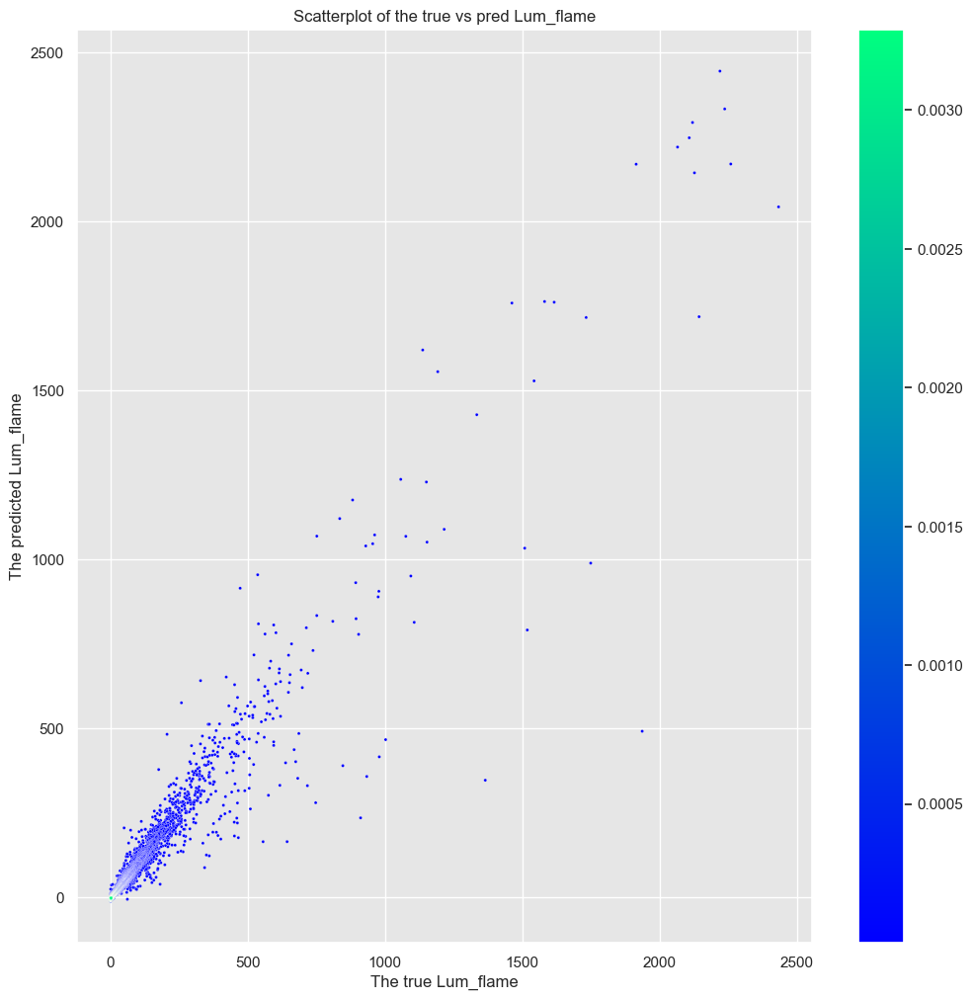

In [182]:
# Plot the Predicted Vs True values of the Lumstage_flame
fig, ax = plt.subplots(figsize = (12,12))
x = Flattened_Valid_Test_Dataset.values[:, 2]
y = Predicted_Values[:, 2]
grid = np.vstack([x, y])
z = gaussian_kde(grid)(grid)
idx = z.argsort()
x,y,z = x[idx], y[idx], z[idx]

im = sns.scatterplot(
    x = x,
    y = y,
    c = z,
    s = 5,
    cmap = "winter",
    )
norm = plt.Normalize(z.min(), z.max())
sm = plt.cm.ScalarMappable(cmap = "winter", norm = norm)
sm.set_array([])
im.figure.colorbar(sm)
ax.set_title("Scatterplot of the true vs pred Lum_flame")
ax.set_xlabel("The true Lum_flame")
ax.set_ylabel("The predicted Lum_flame")
plt.show()

# Conclusion:
By grouping stars into an approximation of stellar clusters and then forming KNN graphs from the resulting clusters, we were able to form graphical representations of star clusters from the GAIA archive. Training a GraphSage Neural Network on the resulting graphs to regress the evolutionary age, age and luminosity of the stars in the graphs, results in more accurate predictions as shown by a lower RMSE and higher r2 score, when compared to training standard feedforward neural network on the original dataset of stars. Compared to to traditional ML approaches, the Graph-based approach also results in more accurate predictions with an rmse score lower than any of the baseline ml models. The inclusion of the information provided by placing stars within their clusters, and then grouping them with their nearest neighbours, provided a measurable difference in performance compared to the baseline models. The graph-based approach allows for the leveraging both the information regarding individual stars and also information about the star's context within it's cluster. 